<a href="https://colab.research.google.com/github/Xaomomo/Unet-with-attention/blob/main/Unet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Descarga datos
Los datos se encuentran en el drive, por lo que usara gdown para sacarlos directamente y no tener que hacer la coneccion, ya que estamos descargando un zip.

Input 1

In [ ]:
!gdown https://drive.google.com/uc?id=1f3hc0IdnyN60NjGoPO9Za9Vnmj9pk3zt

Downloading...
From: https://drive.google.com/uc?id=1f3hc0IdnyN60NjGoPO9Za9Vnmj9pk3zt
To: /content/input.zip
100% 597M/597M [00:13<00:00, 44.9MB/s]


Input 2

In [ ]:
!gdown "1nCyz7YYjTFCQRaYeN5pIM7-bz2neRl4O&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1nCyz7YYjTFCQRaYeN5pIM7-bz2neRl4O&confirm=t
To: /content/input.zip
100% 354M/354M [00:08<00:00, 40.8MB/s]


In [ ]:
!gdown https://drive.google.com/uc?id=1nCyz7YYjTFCQRaYeN5pIM7-bz2neRl4O&confirm=t

Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=1nCyz7YYjTFCQRaYeN5pIM7-bz2neRl4O 



Input 3

In [ ]:
!gdown https://drive.google.com/uc?id=1yDruk2837cVwfizvSghtBy3Ts9j6o0HU

Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=1yDruk2837cVwfizvSghtBy3Ts9j6o0HU 



In [ ]:
!gdown "1yDruk2837cVwfizvSghtBy3Ts9j6o0HU&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1yDruk2837cVwfizvSghtBy3Ts9j6o0HU&confirm=t
To: /content/input.zip
100% 375M/375M [00:05<00:00, 73.6MB/s]


Input 4

In [ ]:
!gdown "1VWlRfbzfrkgiNFHfH5BjIWcXvQ_Fvmr2&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1VWlRfbzfrkgiNFHfH5BjIWcXvQ_Fvmr2&confirm=t
To: /content/input.zip
100% 371M/371M [00:09<00:00, 39.6MB/s]


In [ ]:
!unzip -q input.zip

input/train/images/coronacases_009_149.png  bad CRC e7c81ea4  (should be 4b09508a)


In [ ]:
IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 1

In [ ]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 1

In [ ]:
import nibabel as nib
import os
import numpy as np
from nibabel.testing import data_path
import matplotlib.pyplot as plt
import cv2

In [ ]:
import imageio as iio
import glob
from skimage.transform import resize
src="/content/input/train"
imag="/images/"
X=np.zeros((len(glob.glob(src+imag+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
for i,x in enumerate(sorted(glob.glob(src+imag+"*.png"))):
  if x!="/content/input/train/images/coronacases_009_149.png":
    X[i]=resize(iio.imread(x),(IMG_WIDTH,IMG_HEIGHT,1),mode="constant",preserve_range=True)
mas="/masks/"
Y=np.zeros((len(glob.glob(src+mas+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
for i,x in enumerate(sorted(glob.glob(src+mas+"*.png"))):
  if x!="/content/input/train/masks/coronacases_009_149.png":
    Y[i]=resize(iio.imread(x),(IMG_WIDTH,IMG_HEIGHT,1),mode="constant",preserve_range=True)/255
mas="/Lmasks/"
Z=np.zeros((len(glob.glob(src+mas+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
for i,x in enumerate(sorted(glob.glob(src+mas+"*.png"))):
  if x!="/content/input/train/Lmasks/coronacases_009_149.png":
    Z[i]=resize(iio.imread(x),(IMG_WIDTH,IMG_HEIGHT,1),mode="constant",preserve_range=True)/255

In [ ]:
import imageio as iio
import glob
from skimage.transform import resize
src="/content/input/train"
imag="/images/"
i=0
X=np.zeros((len(glob.glob(src+imag+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
Y=np.zeros((len(glob.glob(src+"/masks/"+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
Z=np.zeros((len(glob.glob(src+"/Lmasks/"+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
for x,y,z in zip(sorted(glob.glob(src+imag+"*.png")),sorted(glob.glob(src+"/masks/"+"*.png")),sorted(glob.glob(src+"/Lmasks/"+"*.png"))):
  if x!="/content/input/train/images/coronacases_009_149.png":
    Z[i]=resize(iio.imread(z),(IMG_WIDTH,IMG_HEIGHT,1),mode="constant",preserve_range=True)/255
    if Z[i].max()!=0:
      X[i]=resize(iio.imread(x),(IMG_WIDTH,IMG_HEIGHT,1),mode="constant",preserve_range=True)
      Y[i]=resize(iio.imread(y),(IMG_WIDTH,IMG_HEIGHT,1),mode="constant",preserve_range=True)/255
    else:
      print(i)
  i+=1


0
1
2
13
24
35
46
57
68
79
90
101
112
113
124
135
146
157
168
179
190
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
257
268
279
290
301
302
395
396
397
398
399
400
401
403
404
405
406
407
408
409
410
411
412
413
424
435
446
457
501
502
503
514
525
536
547
558
569
580
591
602
603
604
605
606
607
608
609
610
611
612
613
614
615
616
617
618
619
620
621
622
623
624
625
626
627
628
629
630
631
632
633
634
635
646
657
668
679
690
871
872
873
874
875
876
877
878
879
881
882
883
884
885
886
887
888
889
890
971
972
1083
1173
1174
1175
1176
1177
1178
1179
1180
1181
1182
1184
1195
1206
1217
1228
1239
1250
1261
1262
1263
1274
1285
1296
1307
1318
1369
1370
1371
1372
1373
1375
1376
1377
1378
1379
1380
1381
1382
1383
1384
1386
1387
1388
1397
1408
1419
1430
1441
1452
1463
1474
1475
1586
1619
1621
1622
1623
1624
1625
1626
1627
1628
1629
1630
1632
1633
163

Without half of the patients, as this patients seem to have problems

In [ ]:
import imageio as iio
import glob
from skimage.transform import resize
src="/content/input/train"
imag="/images/"
i=0
count=0
Siz=0
id=0
ri=0
metadat=[]
c="001"
X=np.zeros((len(glob.glob(src+imag+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
Y=np.zeros((len(glob.glob(src+"/masks/"+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
for x,y,z in zip(sorted(glob.glob(src+imag+"*.png")),sorted(glob.glob(src+"/masks/"+"*.png")),sorted(glob.glob(src+"/Lmasks/"+"*.png"))):
  if x != "/content/input/train/images/coronacases_009_149.png" and -1 == x.find("radiopaedia"):
    Z=iio.imread(z)/255
    if Z.max()!=0:
      X[i]=resize(iio.imread(x),(IMG_WIDTH,IMG_HEIGHT,1),mode="constant",preserve_range=True)
      Y[i]=resize(iio.imread(y),(IMG_WIDTH,IMG_HEIGHT,1),mode="constant",preserve_range=True)/255
      x=x[x.find("_")+1:]
      x=x[:x.find("_")]
      if c!=x:
        metadat.append([id,Siz,ri])
        ri=i
        c=x
        id+=1
        Siz=0
      Siz+=1
      i+=1
    else:
      count+=1
metadat.append([id,Siz,ri])
print(count)
print(i)


425
2155


In [ ]:
np.unique(Z)

Array([0., 1.])

In [ ]:
for i in range(X.shape[0]):
  if X[i,:,:,:].max()==0:
    print(i)
    plt.imshow(np.reshape(Z[i],(128,128)), cmap=plt.cm.gray)
    plt.show()

2080


IndexError: ignored

In [ ]:
src="/content/input/train"
imag="/images/"
Siz=0
dis=0
id=0
ri=0
metadat=[]
c="001"
for i,x in enumerate(sorted(glob.glob(src+imag+"*.png"))):
  if x.find("radiopaedia") == -1:
    x=x[x.find("_")+1:]
    x=x[:x.find("_")]
  else:
    x=x[x.find("_")+1:]
    x=x[:x.find("_",9)]
  if c!=x:
    print(x)
    metadat.append([id,Siz,ri])
    ri=i-dis
    c=x
    id+=1
    Siz=0
  if X[i,:,:,:].max()!=0:
    Siz+=1
  else:
    dis+=1
metadat.append([id,Siz,ri])

002
003
004
005
006
007
008
009
010
10_85902_1
10_85902_3
14_85914_0
27_86410_0
29_86490_1
29_86491_1
36_86526_0
40_86625_0
4_85506_1
7_85703_0


metadat ajustment based on half the patients

In [ ]:
src="/content/input/train"
imag="/images/"
Siz=0
dis=0
id=0
ri=0
metadat=[]
c="001"
for i,x in enumerate(sorted(glob.glob(src+imag+"*.png"))):
  if x.find("radiopaedia") == -1:
    x=x[x.find("_")+1:]
    x=x[:x.find("_")]
    if c!=x:
      print(x)
      metadat.append([id,Siz,ri])
      ri=i-dis
      c=x
      id+=1
      Siz=0
    Siz+=1
metadat.append([id,Siz,ri])

002
003
004
005
006
007
008
009
010


In [ ]:
index=[]
for i in range(X.shape[0]):
  if X[i,:,:,:].max()==0:
    index.append(i)
print(index)
print(X.shape)
X=np.delete(X,index,axis=0)
Y=np.delete(Y,index,axis=0)
print(X.shape)
print(Y.shape)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

In [ ]:
print(metadat)
print(len(sorted(glob.glob("/content/input/train"+"/images/"+"*.png"))))
print(len(sorted(glob.glob("/content/input/train"+"/masks/"+"*.png"))))

[[0, 227, 0], [1, 176, 227], [2, 150, 403], [3, 251, 553], [4, 270, 804], [5, 180, 1074], [6, 219, 1254], [7, 249, 1473], [8, 221, 1722], [9, 212, 1943]]
3520
3520


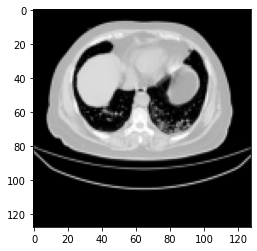

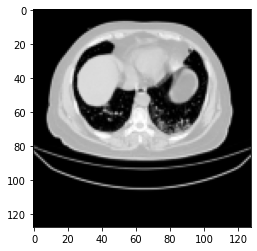

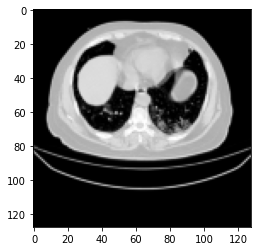

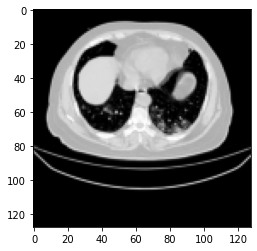

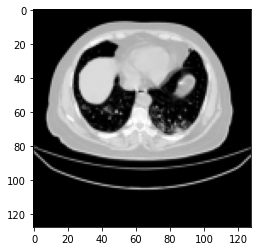

...

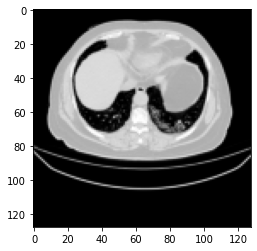

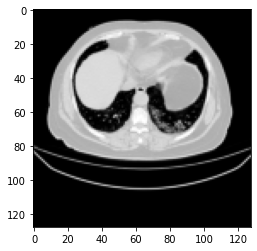

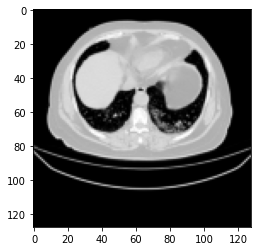

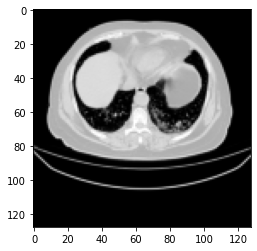

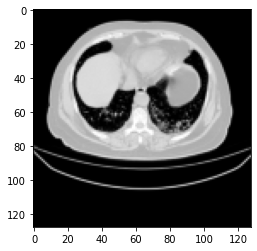

In [ ]:
p=metadat[0]
for x in range(p[1]):
  plt.imshow(np.reshape(X[p[2]+x],(128,128)), cmap=plt.cm.gray)
  plt.show()

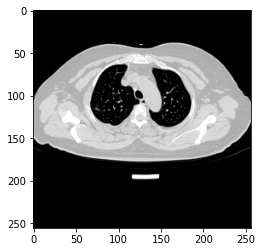

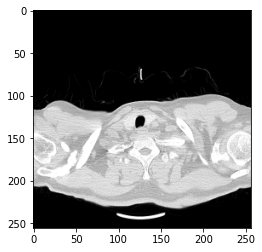

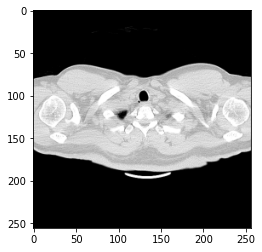

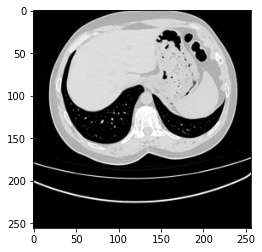

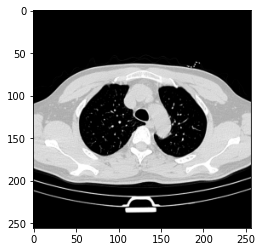

...

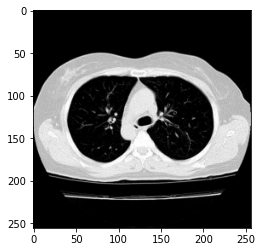

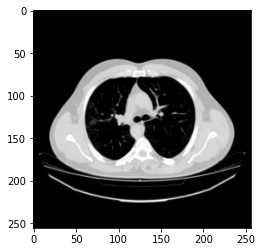

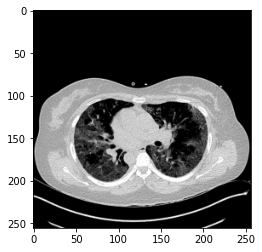

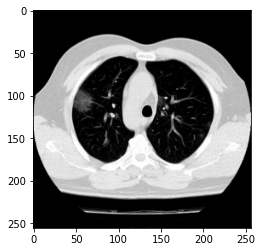

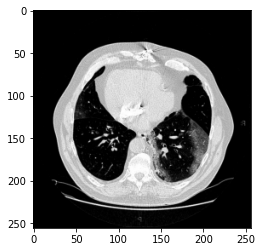

In [ ]:
for x in metadat:
  plt.imshow(np.reshape(X[x[2]+int(x[1]/2)],(256,256)), cmap=plt.cm.gray)
  plt.show()

In [ ]:
sorted(glob.glob(src+imag+"*.png"))[0]

'/content/input/train/images/coronacases_001_0.png'

In [ ]:
c="/content/input/train/images/coronacases_001_0.png"
c=c[c.find("_")+1:]
c=c[:c.find("_")]
print(c)

001


##Borrar directorio /input en caso de error

In [ ]:
!rm -r /content/input

##Train Test Split

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.3, random_state=2)

##New Split

In [ ]:
from sklearn.model_selection import KFold
cv = KFold(n_splits=5, random_state=1, shuffle=True)
IDX=[x for x in range(10)]
IDY=[x for x in range(10)]
for train_index, val_index in cv.split(metadat,metadat):
  print(train_index, val_index)

[ 0  1  2  4  5  7  8  9 11 12 13 14 15 17 18 19] [ 3  6 10 16]
[ 0  1  3  5  6  7  8  9 10 11 12 13 15 16 18 19] [ 2  4 14 17]
[ 2  3  4  5  6  8  9 10 11 12 14 15 16 17 18 19] [ 0  1  7 13]
[ 0  1  2  3  4  5  6  7  8 10 11 12 13 14 16 17] [ 9 15 18 19]
[ 0  1  2  3  4  6  7  9 10 13 14 15 16 17 18 19] [ 5  8 11 12]


In [ ]:
from sklearn.model_selection import train_test_split
IDX=[x for x in range(len(metadat))]
train_index, val_index,_,_=train_test_split(
   IDX,metadat, test_size=0.05, random_state=2)

In [ ]:
for i,x in enumerate(train_index):
  size=metadat[x][1]
  ri=metadat[x][2]
  if i == 0:
    X_train=X[ri:ri+size]
    Y_train=Y[ri:ri+size]
  else:
    X_train=np.concatenate((X_train,X[ri:ri+size]),axis=0)
    Y_train=np.concatenate((Y_train,Y[ri:ri+size]),axis=0)
for i,x in enumerate(val_index):
  size=metadat[x][1]
  ri=metadat[x][2]
  if i == 0:
    X_test=X[ri:ri+size]
    Y_test=Y[ri:ri+size]
  else:
    X_test=np.concatenate((X_test,X[ri:ri+size]),axis=0)
    Y_test=np.concatenate((Y_test,Y[ri:ri+size]),axis=0)

##Unet

In [ ]:
def DiceMetric(y_true, y_pred):
  smooth=1e-6
  gama=2
  y_true, y_pred = tf.cast(
      y_true, dtype=tf.float32), tf.cast(y_pred, tf.float32)
  nominator = 2 * \
      tf.reduce_sum(tf.multiply(y_pred, y_true)) + smooth
  denominator = tf.reduce_sum(
      y_pred ** gama) + tf.reduce_sum(y_true ** gama) + smooth
  result = tf.divide(nominator, denominator)
  return result
def DiceLoss(y_true, y_pred):
      result= 1- DiceMetric(y_true, y_pred)
      return result

In [ ]:
def DiceMetric(mask1, mask2):
  intersect = np.sum(mask1*mask2)
  fsum = np.sum(mask1)
  ssum = np.sum(mask2)
  dice = (2 * intersect ) / (fsum + ssum)
  dice = np.mean(dice)
  return dice

In [ ]:
from keras import backend as K
def iou_coef(y_true, y_pred, smooth=1):
  intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
  union = K.sum(y_true,[1,2,3])+K.sum(y_pred,[1,2,3])-intersection
  iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
  return iou
def dice_coef(y_true, y_pred, smooth=1):
  intersection = K.sum(y_true * y_pred, axis=[1,2,3])
  union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
  dice = K.mean((2. * intersection + smooth)/(union + smooth), axis=0)
  return dice

In [ ]:
import tensorflow as tf
def create_model():

  #Build the model
  inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)
  #s= inputs
  #Contraction path
  c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
  c1 = tf.keras.layers.Dropout(0.1)(c1)
  c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
  p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

  c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
  c2 = tf.keras.layers.Dropout(0.1)(c2)
  c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
  p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

  c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
  c3 = tf.keras.layers.Dropout(0.2)(c3)
  c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
  p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

  c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
  c4 = tf.keras.layers.Dropout(0.2)(c4)
  c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
  p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)

  c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
  c5 = tf.keras.layers.Dropout(0.3)(c5)
  c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

  #Expansive path
  u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
  u6 = tf.keras.layers.concatenate([u6, c4])
  c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
  c6 = tf.keras.layers.Dropout(0.2)(c6)
  c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

  u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
  u7 = tf.keras.layers.concatenate([u7, c3])
  c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
  c7 = tf.keras.layers.Dropout(0.2)(c7)
  c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

  u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
  u8 = tf.keras.layers.concatenate([u8, c2])
  c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
  c8 = tf.keras.layers.Dropout(0.1)(c8)
  c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

  u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
  u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
  c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
  c9 = tf.keras.layers.Dropout(0.1)(c9)
  c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

  outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)

  model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy',iou_coef,dice_coef])
  #model.summary()
  return model

##Model Fit

In [ ]:
model=create_model()

In [ ]:
model.fit(X_train,Y_train,batch_size=16,epochs=25,validation_split=0.2)

Epoch 1/25


KeyboardInterrupt: ignored

In [ ]:
model=create_model()
model.fit(X_train,Y_train,batch_size=16,epochs=25)

Epoch 1/25
214/214 [==============================] - 19s 44ms/step - loss: 0.0462 - accuracy: 0.9830 - iou_coef: 0.0311 - dice_coef: 0.0487
Epoch 2/25
214/214 [==============================] - 9s 41ms/step - loss: 0.0173 - accuracy: 0.9890 - iou_coef: 0.1215 - dice_coef: 0.1716
Epoch 3/25
214/214 [==============================] - 9s 41ms/step - loss: 0.0116 - accuracy: 0.9900 - iou_coef: 0.2478 - dice_coef: 0.3147
Epoch 4/25
214/214 [==============================] - 9s 42ms/step - loss: 0.0093 - accuracy: 0.9902 - iou_coef: 0.3368 - dice_coef: 0.4067
Epoch 5/25
214/214 [==============================] - 9s 42ms/step - loss: 0.0082 - accuracy: 0.9903 - iou_coef: 0.3998 - dice_coef: 0.4714
Epoch 6/25
214/214 [==============================] - 9s 43ms/step - loss: 0.0079 - accuracy: 0.9904 - iou_coef: 0.4099 - dice_coef: 0.4820
Epoch 7/25
214/214 [==============================] - 9s 43ms/step - loss: 0.0073 - accuracy: 0.9904 - iou_coef: 0.4457 - dice_coef: 0.5169
Epoch 8/25
214/214 

In [ ]:
model=create_model()
model.fit(X_train,Y_train,batch_size=16,epochs=100)

Epoch 1/100
118/118 [==============================] - 7s 42ms/step - loss: 0.0743 - accuracy: 0.9708 - iou_coef: 0.0276 - dice_coef: 0.0460
Epoch 2/100
118/118 [==============================] - 5s 42ms/step - loss: 0.0239 - accuracy: 0.9862 - iou_coef: 0.0799 - dice_coef: 0.1239
Epoch 3/100
118/118 [==============================] - 5s 42ms/step - loss: 0.0177 - accuracy: 0.9862 - iou_coef: 0.1554 - dice_coef: 0.2227
Epoch 4/100
118/118 [==============================] - 5s 42ms/step - loss: 0.0146 - accuracy: 0.9870 - iou_coef: 0.2259 - dice_coef: 0.3065
Epoch 5/100
118/118 [==============================] - 5s 42ms/step - loss: 0.0118 - accuracy: 0.9881 - iou_coef: 0.3085 - dice_coef: 0.3985
Epoch 6/100
118/118 [==============================] - 5s 43ms/step - loss: 0.0100 - accuracy: 0.9883 - iou_coef: 0.3662 - dice_coef: 0.4571
Epoch 7/100
118/118 [==============================] - 5s 43ms/step - loss: 0.0091 - accuracy: 0.9884 - iou_coef: 0.4128 - dice_coef: 0.5042
Epoch 8/100
1

In [ ]:
scores= model.evaluate(X_test, Y_test, verbose=0)
print(f'Score for fold {0}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}% {model.metrics_names[2]} of {scores[2]*100}% {model.metrics_names[3]} of {scores[3]*100}%')

Score for fold 0: loss of 0.08975977450609207; accuracy of 94.9536144733429% iou_coef of 40.004414319992065% dice_coef of 54.930925369262695%


##Fit on new Data

In [ ]:
model=create_model()
model.fit(X_train,Y_train,batch_size=16,epochs=25)

Epoch 1/25
52/52 [==============================] - 4s 41ms/step - loss: 0.0917 - accuracy: 0.9704 - DiceMetric: 0.1460
Epoch 2/25
52/52 [==============================] - 2s 40ms/step - loss: 0.0449 - accuracy: 0.9770 - DiceMetric: 0.2954
Epoch 3/25
52/52 [==============================] - 2s 40ms/step - loss: 0.0357 - accuracy: 0.9770 - DiceMetric: 0.4464
Epoch 4/25
52/52 [==============================] - 2s 41ms/step - loss: 0.0294 - accuracy: 0.9770 - DiceMetric: 0.5695
Epoch 5/25
52/52 [==============================] - 2s 40ms/step - loss: 0.0256 - accuracy: 0.9778 - DiceMetric: 0.6378
Epoch 6/25
52/52 [==============================] - 2s 41ms/step - loss: 0.0220 - accuracy: 0.9802 - DiceMetric: 0.7352
Epoch 7/25
52/52 [==============================] - 2s 40ms/step - loss: 0.0192 - accuracy: 0.9807 - DiceMetric: 0.8126
Epoch 8/25
52/52 [==============================] - 2s 41ms/step - loss: 0.0182 - accuracy: 0.9808 - DiceMetric: 0.8364
Epoch 9/25
52/52 [======================

##Testing

In [ ]:
Ypred=model.predict(X_test)

10/10 [==============================] - 1s 51ms/step


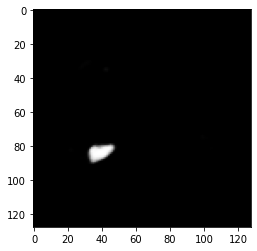

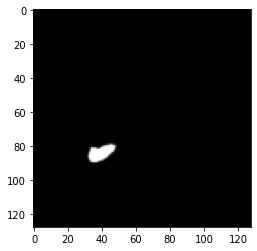

In [ ]:
import random
Ypred=model.predict(X_test)
rid=random.randint(0,Ypred.shape[0]-1)
plt.imshow(np.reshape(Ypred[rid],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Y_test[rid],(128,128)), cmap=plt.cm.gray)
plt.show()

In [ ]:
import random

random.randint(0,Ypred.shape[0])

168

In [ ]:
def dice(true_mask, pred_mask, non_seg_score=1.0):
    """
        Computes the Dice coefficient.
        Args:
            true_mask : Array of arbitrary shape.
            pred_mask : Array with the same shape than true_mask.

        Returns:
            A scalar representing the Dice coefficient between the two segmentations.

    """
    assert true_mask.shape == pred_mask.shape
    true_mask = np.asarray(true_mask).astype(bool)
    #pred_mask = np.asarray(pred_mask).astype(bool)
    pred_mask[pred_mask<0]
    # If both segmentations are all zero, the dice will be 1. (Developer decision)
    im_sum = true_mask.sum() + pred_mask.sum()
    if im_sum == 0:
        return non_seg_score

    # Compute Dice coefficient
    intersection = np.logical_and(true_mask, pred_mask)
    return 2. * intersection.sum() / im_sum

In [ ]:
diceaux=dice(Y_test,Ypred)
diceaux

0.12167137779005797

## Model Fit Kfold

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from numpy import mean
from numpy import absolute
from numpy import sqrt
import pandas as pd

In [ ]:
cv = KFold(n_splits=5, shuffle=True)

25 epochs

In [ ]:
VALIDATION_ACCURACY = []
VALIDAITON_LOSS = []
nfold=1
for train_index, val_index in cv.split(metadat,metadat):
  model = create_model()
  for i,x in enumerate(train_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      X_fold=X[ri:ri+size]
      Y_fold=Y[ri:ri+size]
    else:
      X_fold=np.concatenate((X_fold,X[ri:ri+size]),axis=0)
      Y_fold=np.concatenate((Y_fold,Y[ri:ri+size]),axis=0)
  for i,x in enumerate(val_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      Xtest_fold=X[ri:ri+size]
      Ytest_fold=Y[ri:ri+size]
    else:
      Xtest_fold=np.concatenate((Xtest_fold,X[ri:ri+size]),axis=0)
      Ytest_fold=np.concatenate((Ytest_fold,Y[ri:ri+size]),axis=0)


  model.fit(X_fold,Y_fold,batch_size=16,epochs=25,validation_split=0.2,verbose=0)

  scores= model.evaluate(Xtest_fold, Ytest_fold, verbose=0)
  print(f'Score for fold {nfold}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}% {model.metrics_names[2]} of {scores[2]*100}%')
  nfold+=1

Score for fold 1: loss of 0.0636814683675766; accuracy of 98.55179190635681% DiceMetric of 32.425251603126526%


KeyboardInterrupt: ignored

In [ ]:
VALIDATION_ACCURACY = []
VALIDAITON_LOSS = []
nfold=1
for train_index, val_index in cv.split(metadat,metadat):
  model = create_model()
  for i,x in enumerate(train_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      X_fold=X[ri:ri+size]
      Y_fold=Y[ri:ri+size]
    else:
      X_fold=np.concatenate((X_fold,X[ri:ri+size]),axis=0)
      Y_fold=np.concatenate((Y_fold,Y[ri:ri+size]),axis=0)
  for i,x in enumerate(val_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      Xtest_fold=X[ri:ri+size]
      Ytest_fold=Y[ri:ri+size]
    else:
      Xtest_fold=np.concatenate((Xtest_fold,X[ri:ri+size]),axis=0)
      Ytest_fold=np.concatenate((Ytest_fold,Y[ri:ri+size]),axis=0)


  model.fit(X_fold,Y_fold,batch_size=16,epochs=25,verbose=0)

  scores= model.evaluate(Xtest_fold, Ytest_fold, verbose=0)
  print(f'Score for fold {nfold}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}% {model.metrics_names[2]} of {scores[2]*100}%')

NameError: ignored

In [ ]:
def findsize(meta,index):
  size=[]
  for i in index:
    size.append(meta[i][1])
  return size

In [ ]:
VALIDATION_ACCURACY = []
VALIDAITON_LOSS = []
nfold=1
for train_index, val_index in cv.split(metadat,metadat):
  model = create_model()
  print(train_index)
  print(val_index)
  print(findsize(metadat,train_index))
  print(findsize(metadat,val_index))
  for i,x in enumerate(train_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      X_fold=X[ri:ri+size]
      Y_fold=Y[ri:ri+size]
    else:
      X_fold=np.concatenate((X_fold,X[ri:ri+size]),axis=0)
      Y_fold=np.concatenate((Y_fold,Y[ri:ri+size]),axis=0)
  for i,x in enumerate(val_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      Xtest_fold=X[ri:ri+size]
      Ytest_fold=Y[ri:ri+size]
    else:
      Xtest_fold=np.concatenate((Xtest_fold,X[ri:ri+size]),axis=0)
      Ytest_fold=np.concatenate((Ytest_fold,Y[ri:ri+size]),axis=0)


  model.fit(X_fold,Y_fold,batch_size=16,epochs=25,verbose=0)

  scores= model.evaluate(Xtest_fold, Ytest_fold, verbose=0)
  print(model.metrics_names)
  print(scores)
  print(f'Score for fold {nfold}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}% {model.metrics_names[2]} of {scores[2]*100}% {model.metrics_names[3]} of {scores[3]*100}%')

[ 0  1  2  4  5  7  8  9 11 12 13 14 15 17 18 19]
[ 3  6 10 16]
[301, 200, 200, 290, 213, 301, 255, 301, 418, 110, 66, 42, 42, 93, 39, 45]
[270, 249, 39, 45]
['loss', 'accuracy', 'iou_coef', 'dice_coef']
[0.005301733501255512, 0.9955745935440063, 0.49938803911209106, 0.5513038635253906]
Score for fold 1: loss of 0.005301733501255512; accuracy of 99.55745935440063% iou_coef of 49.938803911209106% dice_coef of 55.13038635253906%
[ 0  1  3  5  6  7  8  9 10 11 12 13 15 16 18 19]
[ 2  4 14 17]
[301, 200, 270, 213, 249, 301, 255, 301, 39, 418, 110, 66, 42, 45, 39, 45]
[200, 290, 42, 93]
['loss', 'accuracy', 'iou_coef', 'dice_coef']
[0.023119503632187843, 0.9830157160758972, 0.6204782724380493, 0.6928073167800903]
Score for fold 1: loss of 0.023119503632187843; accuracy of 98.30157160758972% iou_coef of 62.04782724380493% dice_coef of 69.28073167800903%
[ 2  3  4  5  6  8  9 10 11 12 14 15 16 17 18 19]
[ 0  1  7 13]
[200, 270, 290, 213, 249, 255, 301, 39, 418, 110, 42, 42, 45, 93, 39, 45]
[3

Test1:

[ 0  1  2  4  5  7  8  9 11 12 13 14 15 17 18 19]
[ 3  6 10 16]

Score for fold 1: loss of 0.0053466688841581345; accuracy of 99.50543642044067% DiceMetric of 43.94007623195648%

[ 0  1  3  5  6  7  8  9 10 11 12 13 15 16 18 19]
[ 2  4 14 17]

Score for fold 1: loss of 0.026559554040431976; accuracy of 97.98887372016907% DiceMetric of 66.7205810546875%

[ 2  3  4  5  6  8  9 10 11 12 14 15 16 17 18 19]
[ 0  1  7 13]

Score for fold 1: loss of 0.03422855958342552; accuracy of 98.55093955993652% DiceMetric of 47.770729660987854%

[ 0  1  2  3  4  5  6  7  8 10 11 12 13 14 16 17]
[ 9 15 18 19]

Score for fold 1: loss of 0.02950642630457878; accuracy of 97.68684506416321% DiceMetric of 74.00564551353455%

[ 0  1  2  3  4  6  7  9 10 13 14 15 16 17 18 19]
[ 5  8 11 12]

Score for fold 1: loss of 0.01903810352087021; accuracy of 98.92528653144836% DiceMetric of 43.97192299365997%

Test 2:

[ 0  1  2  4  5  7  8  9 11 12 13 14 15 17 18 19]
[ 3  6 10 16]

Score for fold 1: loss of 0.006871683523058891; accuracy of 99.50516819953918% DiceMetric of 38.52519392967224%

[ 0  1  3  5  6  7  8  9 10 11 12 13 15 16 18 19]
[ 2  4 14 17]

Score for fold 1: loss of 0.029412657022476196; accuracy of 97.94819951057434% DiceMetric of 65.24405479431152%

[ 2  3  4  5  6  8  9 10 11 12 14 15 16 17 18 19]
[ 0  1  7 13]

Score for fold 1: loss of 0.024903733283281326; accuracy of 98.55693578720093% DiceMetric of 52.870744466781616%

[ 0  1  2  3  4  5  6  7  8 10 11 12 13 14 16 17]
[ 9 15 18 19]

Score for fold 1: loss of 0.026596274226903915; accuracy of 97.72805571556091% DiceMetric of 74.23399090766907%

[ 0  1  2  3  4  6  7  9 10 13 14 15 16 17 18 19]
[ 5  8 11 12]

Score for fold 1: loss of 0.017340419813990593; accuracy of 98.92194271087646% DiceMetric of 44.83867585659027%

Test 3:

[ 0  1  2  3  5  7  8  9 11 12 14 15 16 17 18 19]
[ 4  6 10 13]

Score for fold 1: loss of 0.00697745056822896; accuracy of 99.36680197715759% DiceMetric of 48.23821187019348%

[ 0  3  4  5  6  7  8  9 10 11 13 14 15 16 18 19]
[ 1  2 12 17]

Score for fold 1: loss of 0.07038062065839767; accuracy of 96.59968614578247% DiceMetric of 66.7693018913269%

[ 0  1  2  4  5  6  7  8 10 12 13 15 16 17 18 19]
[ 3  9 11 14]

Score for fold 1: loss of 0.008919965475797653; accuracy of 99.10269379615784% DiceMetric of 46.52714431285858%

[ 0  1  2  3  4  6  7  8  9 10 11 12 13 14 17 19]
[ 5 15 16 18]

Score for fold 1: loss of 0.013541490770876408; accuracy of 99.09932017326355% DiceMetric of 52.49675512313843%

[ 1  2  3  4  5  6  9 10 11 12 13 14 15 16 17 18]
[ 0  7  8 19]

Score for fold 1: loss of 0.02126297727227211; accuracy of 98.72499108314514% DiceMetric of 47.10354506969452%

Test 4:

[ 2  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
[0 1 3 4]

Score for fold 1: loss of 0.015813792124390602; accuracy of 99.16654229164124% DiceMetric of 49.64415729045868%

[ 0  1  3  4  5  6  8  9 11 12 13 14 15 16 18 19]
[ 2  7 10 17]

Score for fold 1: loss of 0.03060799278318882; accuracy of 97.45190739631653% DiceMetric of 69.28094625473022%

[ 0  1  2  3  4  5  7  8  9 10 11 12 13 14 15 17]
[ 6 16 18 19]

Score for fold 1: loss of 0.02446666918694973; accuracy of 98.80074858665466% DiceMetric of 47.46796488761902%

[ 0  1  2  3  4  6  7  9 10 12 14 15 16 17 18 19]
[ 5  8 11 13]

Score for fold 1: loss of 0.007132690399885178; accuracy of 99.35418963432312% DiceMetric of 43.110546469688416%

[ 0  1  2  3  4  5  6  7  8 10 11 13 16 17 18 19]
[ 9 12 14 15]

Score for fold 1: loss of 0.042322106659412384; accuracy of 97.27025628089905% DiceMetric of 63.12412619590759%

Test 5:

[ 1  2  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 0  3  4 19]

Score for fold 1: loss of 0.014646883122622967; accuracy of 99.12611246109009% DiceMetric of 43.503838777542114%

[ 0  2  3  4  6  7  8  9 10 11 12 13 14 15 18 19]
[ 1  5 16 17]

Score for fold 1: loss of 0.02356589399278164; accuracy of 98.4293520450592% DiceMetric of 59.04039740562439%

[ 0  1  2  3  4  5  7  8 10 11 12 13 16 17 18 19]
[ 6  9 14 15]

Score for fold 1: loss of 0.01259925588965416; accuracy of 98.71116876602173% DiceMetric of 56.999194622039795%

[ 0  1  2  3  4  5  6  7  8  9 12 14 15 16 17 19]
[10 11 13 18]

Score for fold 1: loss of 0.014925715513527393; accuracy of 99.07234311103821% DiceMetric of 42.716413736343384%

[ 0  1  3  4  5  6  9 10 11 13 14 15 16 17 18 19]
[ 2  7  8 12]

Score for fold 1: loss of 0.03533311188220978; accuracy of 97.90989756584167% DiceMetric of 56.42458200454712%

50 epochs

In [ ]:
VALIDATION_ACCURACY = []
VALIDAITON_LOSS = []
nfold=1
for train_index, val_index in cv.split(metadat,metadat):
  model = create_model()
  for i,x in enumerate(train_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      X_fold=X[ri:ri+size]
      Y_fold=Y[ri:ri+size]
    else:
      X_fold=np.concatenate((X_fold,X[ri:ri+size]),axis=0)
      Y_fold=np.concatenate((Y_fold,Y[ri:ri+size]),axis=0)
  for i,x in enumerate(val_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      Xtest_fold=X[ri:ri+size]
      Ytest_fold=Y[ri:ri+size]
    else:
      Xtest_fold=np.concatenate((Xtest_fold,X[ri:ri+size]),axis=0)
      Ytest_fold=np.concatenate((Ytest_fold,Y[ri:ri+size]),axis=0)

  model.fit(X_fold,Y_fold,batch_size=16,epochs=50,validation_split=0.2,verbose=0)

  scores= model.evaluate(Xtest_fold, Ytest_fold, verbose=0)
  print(f'Score for fold {nfold}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}% {model.metrics_names[2]} of {scores[2]*100}%')
  nfold+=1

Score for fold 1: loss of 0.006736287381500006; accuracy of 99.56292510032654% DiceMetric of 39.39846456050873%
Score for fold 2: loss of 0.03704747557640076; accuracy of 98.20736050605774% DiceMetric of 50.91923475265503%
Score for fold 3: loss of 0.05178474262356758; accuracy of 98.84861707687378% DiceMetric of 34.65709090232849%
Score for fold 4: loss of 0.02796047180891037; accuracy of 98.22394847869873% DiceMetric of 66.22821092605591%
Score for fold 5: loss of 0.021386656910181046; accuracy of 99.05768036842346% DiceMetric of 38.18826675415039%


In [ ]:
VALIDATION_ACCURACY = []
VALIDAITON_LOSS = []
nfold=1
for train_index, val_index in cv.split(metadat,metadat):
  model = create_model()
  for i,x in enumerate(train_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      X_fold=X[ri:ri+size]
      Y_fold=Y[ri:ri+size]
    else:
      X_fold=np.concatenate((X_fold,X[ri:ri+size]),axis=0)
      Y_fold=np.concatenate((Y_fold,Y[ri:ri+size]),axis=0)
  for i,x in enumerate(val_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      Xtest_fold=X[ri:ri+size]
      Ytest_fold=Y[ri:ri+size]
    else:
      Xtest_fold=np.concatenate((Xtest_fold,X[ri:ri+size]),axis=0)
      Ytest_fold=np.concatenate((Ytest_fold,Y[ri:ri+size]),axis=0)

  model.fit(X_fold,Y_fold,batch_size=16,epochs=50,verbose=0)

  scores= model.evaluate(Xtest_fold, Ytest_fold, verbose=0)
  print(f'Score for fold {nfold}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}% {model.metrics_names[2]} of {scores[2]*100}% {model.metrics_names[3]} of {scores[3]*100}%')
  nfold+=1

Score for fold 1: loss of 0.0064053842797875404; accuracy of 99.54716563224792% iou_coef of 59.5636248588562% dice_coef of 64.62090611457825%
Score for fold 2: loss of 0.022000694647431374; accuracy of 98.31899404525757% iou_coef of 63.60125541687012% dice_coef of 70.63370943069458%
Score for fold 3: loss of 0.030282912775874138; accuracy of 98.81208539009094% iou_coef of 50.68950057029724% dice_coef of 58.141136169433594%
Score for fold 4: loss of 0.019584670662879944; accuracy of 98.2728898525238% iou_coef of 57.3783278465271% dice_coef of 66.4768397808075%
Score for fold 5: loss of 0.019198283553123474; accuracy of 99.0639328956604% iou_coef of 56.433212757110596% dice_coef of 62.42772936820984%


In [ ]:
def patch(X,psize):
  try:
    npatch=int(X.shape[1]/psize)
  except:
    print("kek")
  patches=[]
  for i in range(npatch):
    st=i*psize
    end=st+psize
    for j in range(npatch):
      st2=j*psize
      end2=st2+psize
      patch= X[st:end,st2:end2,:]
      print(patch.shape)
      patches.append(patch)
  return patches

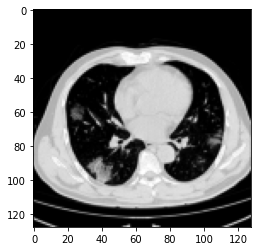

(32, 32, 1)
(32, 32, 1)
(32, 32, 1)
(32, 32, 1)
(32, 32, 1)
(32, 32, 1)
(32, 32, 1)
(32, 32, 1)
(32, 32, 1)
(32, 32, 1)
(32, 32, 1)
(32, 32, 1)
(32, 32, 1)
(32, 32, 1)
(32, 32, 1)
(32, 32, 1)


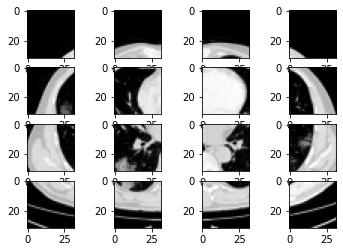

In [ ]:
plt.imshow(np.reshape(X[499],(128,128)), cmap=plt.cm.gray)
plt.show()
imag=patch(X[499],32)
figure, axes = plt.subplots(4, 4)
for ax,x in enumerate(imag):
  axes[int(ax/4),ax%4].imshow(np.reshape(x,(32,32)), cmap=plt.cm.gray)
plt.show()

In [ ]:
for ax,x in enumerate(imag):
  print(int(ax/4))


0
0
0
0
1
1
1
1
2
2
2
2
3
3
3
3


#Unet with categorical crossentropy

Uno de los problemas que tenia mi implementacion anterior, era el uso de sigmoid como activacion final y el uso de binary crossentropy como funcion de costo. Este diferia del proceso normal, pero se vio necesario hacerlo en el momento, dada la distribucion de los datos que tenia. La idea de los cambios a hacer, es que los datos funcionen junto con softmax como capa final y loss usando categorical crossentropy.

In [ ]:
!gdown "1yDruk2837cVwfizvSghtBy3Ts9j6o0HU&confirm=t"

In [ ]:
!gdown "1KJPU1D0ewHmU7Jzl1irq3Gb-JkUqV1VR&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1KJPU1D0ewHmU7Jzl1irq3Gb-JkUqV1VR&confirm=t
To: /content/input.zip
100% 367M/367M [00:02<00:00, 141MB/s]


In [ ]:
!unzip -q input.zip

In [ ]:
IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 1

In [ ]:
import nibabel as nib
import os
import numpy as np
from nibabel.testing import data_path
import matplotlib.pyplot as plt
import cv2

In [ ]:
import imageio as iio
import glob
from skimage.transform import resize
import PIL
from PIL import Image
src="/content/input/train"
imag="/images/"
X=np.zeros((len(glob.glob(src+imag+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
for i,x in enumerate(sorted(glob.glob(src+imag+"*.png"))):
  if x!="/content/input/train/images/coronacases_009_149.png":
    im=Image.open(x)
    X[i,:,:,0]=im.resize((IMG_WIDTH,IMG_HEIGHT),resample=PIL.Image.NEAREST)
mas="/masks/"
Y=np.zeros((len(glob.glob(src+mas+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
for i,x in enumerate(sorted(glob.glob(src+mas+"*.png"))):
  if x!="/content/input/train/masks/coronacases_009_149.png":
    im=Image.open(x)
    im=np.array(im.resize((IMG_WIDTH,IMG_HEIGHT),resample=PIL.Image.NEAREST))/255
    Y[i,:,:,0]=im

Amask

Una de las complicaciones del manejo del dataset, era el reshape y resize de las imagenes. Dado el metodo que estaba ocupando antes, usando la libreria de PIL, sin definir la interpolacion, este no daba problemas para la imagen regular. Pero cuando consideramos las mascaras, que estan divididos en clases, siendo 0 aire, 85 pulmon derecho, 170 pulmon izquierdo, 255 infeccion, hablando en termino de pixeles, los valores se dristribuian y se perdia la identificacion. Como ejemplo si los datos estaban en [0,85,179,255], despues de un manejo sin definir resample, quedaba en [0,1,2,..,255]. La forma de arreglar esto fue definir el resample, dentro del resize de PIL, PIL.Image.NEAREST, de esta forma se pudo asegurar que la integridad de los labels quede.

Para sacar el mayor provecho del softmax se usara Amask que es la mascara que contiene todas las clases. Nearest se usara para los dos resizings, mas que nada para consistencia.

In [ ]:
import imageio as iio
import glob
from skimage.transform import resize
import PIL
from PIL import Image
src="/content/input/train"
imag="/images/"
X=np.zeros((len(glob.glob(src+imag+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
for i,x in enumerate(sorted(glob.glob(src+imag+"*.png"))):
  if x!="/content/input/train/images/coronacases_009_149.png":
    im=Image.open(x)
    X[i,:,:,0]=im.resize((IMG_WIDTH,IMG_HEIGHT),resample=PIL.Image.NEAREST)
mas="/Amasks/"
Y=np.zeros((len(glob.glob(src+mas+"*.png")),IMG_WIDTH,IMG_HEIGHT))
for i,x in enumerate(sorted(glob.glob(src+mas+"*.png"))):
  if x!="/content/input/train/Amasks/coronacases_009_149.png":
    im=Image.open(x)
    im=np.array(im.resize((IMG_WIDTH,IMG_HEIGHT),resample=PIL.Image.NEAREST))
    im[im==85]=1
    im[im==170]=2
    im[im==255]=3
    Y[i,:,:]=im

In [ ]:
import imageio as iio
import glob
from skimage.transform import resize
import PIL
from PIL import Image
src="/content/input/train"
imag="/images/"
X=np.zeros((len(glob.glob(src+imag+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
for i,x in enumerate(sorted(glob.glob(src+imag+"*.png"))):
  if x!="/content/input/train/images/coronacases_009_149.png":
    im=Image.open(x)
    X[i,:,:,0]=im.resize((IMG_WIDTH,IMG_HEIGHT),resample=PIL.Image.NEAREST)
mas="/Amasks/"
Y=np.zeros((len(glob.glob(src+mas+"*.png")),IMG_WIDTH,IMG_HEIGHT))
for i,x in enumerate(sorted(glob.glob(src+mas+"*.png"))):
  if x!="/content/input/train/Amasks/coronacases_009_149.png":
    im=Image.open(x)
    im=np.array(im.resize((IMG_WIDTH,IMG_HEIGHT),resample=PIL.Image.NEAREST))/255
    Y[i,:,:]=im

In [ ]:
import tensorflow as tf
print(Y.shape)
print(np.unique(Y))
Y=tf.keras.utils.to_categorical(Y)
print(Y.shape)
print(np.unique(Y))

(3520, 128, 128)
[0. 1. 2. 3.]
(3520, 128, 128, 4)
[0. 1.]


In [ ]:
import imageio as iio
import glob
from skimage.transform import resize
import PIL
from PIL import Image
src="/content/input/train"
imag="/images/"
X=np.zeros((len(glob.glob(src+imag+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
for i,x in enumerate(sorted(glob.glob(src+imag+"*.png"))):
  if x!="/content/input/train/images/coronacases_009_149.png":
    im=Image.open(x)
    X[i,:,:,0]=im.resize((IMG_WIDTH,IMG_HEIGHT),resample=PIL.Image.NEAREST)
mas="/masks/"
mas2="/Lmasks/"
i=0
Y=np.zeros((len(glob.glob(src+mas+"*.png")),IMG_WIDTH,IMG_HEIGHT,3))
for x in sorted(glob.glob(src+mas+"*.png")):
  if x!="/content/input/train/masks/coronacases_009_149.png":
    im=Image.open(x)
    im=np.array(im.resize((IMG_WIDTH,IMG_HEIGHT),resample=PIL.Image.NEAREST))
    im[im==255]=1
    Y[i,:,:,0]=im
    i+=1
i=0
for x in sorted(glob.glob(src+mas2+"*.png")):
  if x!="/content/input/train/Lmasks/coronacases_009_149.png":
    im2=Image.open(x)
    im3=im2
    im2=np.array(im2.resize((IMG_WIDTH,IMG_HEIGHT),resample=PIL.Image.NEAREST))
    im2[im2==170]=0
    im2[im2==85]=1
    Y[i,:,:,1]=im2
    im3=np.array(im3.resize((IMG_WIDTH,IMG_HEIGHT),resample=PIL.Image.NEAREST))
    im3[im3==170]=1
    im3[im3==85]=0
    Y[i,:,:,2]=im3
    i+=1



In [ ]:
print(np.unique(Y))

[0. 1.]


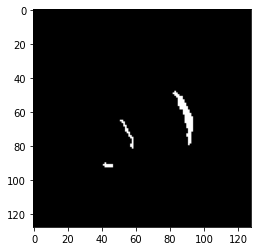

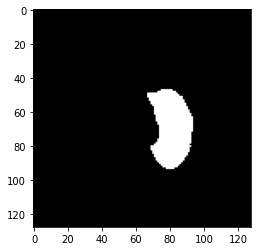

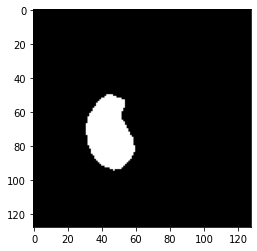

In [ ]:
plt.imshow(im, cmap=plt.cm.gray)
plt.show()
plt.imshow(im2, cmap=plt.cm.gray)
plt.show()
plt.imshow(im3, cmap=plt.cm.gray)
plt.show()

In [ ]:
Y[Y==85]=1
Y[Y==170]=2
Y[Y==255]=3

In [ ]:
import imageio as iio
import glob
from skimage.transform import resize
src="/content/input/train"
imag="/images/"
X=np.zeros((len(glob.glob(src+imag+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
for i,x in enumerate(sorted(glob.glob(src+imag+"*.png"))):
  if x!="/content/input/train/images/coronacases_009_149.png":
    X[i]=resize(iio.imread(x),(IMG_WIDTH,IMG_HEIGHT,1),mode="constant",preserve_range=True)
mas="/masks/"
mas2="/Lmasks/"
Y=np.zeros((len(glob.glob(src+mas+"*.png")),IMG_WIDTH,IMG_HEIGHT,2))
i=0
for x,y in zip(sorted(glob.glob(src+mas+"*.png")),sorted(glob.glob(src+mas2+"*.png"))):
  if x!="/content/input/train/masks/coronacases_009_149.png":
    auz=iio.imread(x)/255
    auy=iio.imread(y)/255
    if i==122:
      print(np.unique(auz))
      print(np.unique(auy))
    auz=resize(auz,(IMG_WIDTH,IMG_HEIGHT),mode="constant",preserve_range=True)
    auy=resize(auy,(IMG_WIDTH,IMG_HEIGHT),mode="constant",preserve_range=True)
    if i==122:
      print(np.unique(auz))
      print(np.unique(auy))
    Y[i,:,:,0]=auz
    Y[i,:,:,1]=auy
    i+=1

In [ ]:
from PIL import Image
import skimage.measure as ima
import imageio as iio
import glob
from skimage.transform import resize
src="/content/input/train"
imag="/images/"
X=np.zeros((len(glob.glob(src+imag+"*.png"))-1,IMG_WIDTH,IMG_HEIGHT,1))
i=0
for x in sorted(glob.glob(src+imag+"*.png")):
  if x!="/content/input/train/images/coronacases_009_149.png":
    X[i]=resize(iio.imread(x),(IMG_WIDTH,IMG_HEIGHT,1),mode="constant",preserve_range=True)
    i+=1
mas="/masks/"
mas2="/Lmasks/"
Y=np.zeros((len(glob.glob(src+mas+"*.png"))-1,IMG_WIDTH,IMG_HEIGHT,2))
i=0
for x,y in zip(sorted(glob.glob(src+mas+"*.png")),sorted(glob.glob(src+mas2+"*.png"))):
  if x!="/content/input/train/masks/coronacases_009_149.png":
    auz=iio.imread(x)
    auy=iio.imread(y)
    if y=="/content/input/train/Lmasks/coronacases_001_271.png":
      print(np.unique(auz))
      print(np.unique(auy))
    auz=ima.block_reduce(auz, (4,4), np.max)/255
    auy=ima.block_reduce(auy, (4,4), np.max)/255
    #auz=resize(auz,(IMG_WIDTH,IMG_HEIGHT),mode="constant",preserve_range=True)
    #auy=resize(auy,(IMG_WIDTH,IMG_HEIGHT),mode="constant",preserve_range=True)
    if y=="/content/input/train/Lmasks/coronacases_001_271.png":
      print(np.unique(auz))

      print(np.unique(auy))
    Y[i,:,:,0]=auz
    Y[i,:,:,1]=auy
    i+=1

[0]
[  0 255]
[0.]
[0. 1.]


In [ ]:
from PIL import Image
import skimage.measure as ima
import imageio as iio
import glob
from skimage.transform import resize
src="/content/input/train"
imag="/images/"
X=np.zeros((len(glob.glob(src+imag+"*.png"))-1,IMG_WIDTH,IMG_HEIGHT,1))
i=0
for x in sorted(glob.glob(src+imag+"*.png")):
  if x!="/content/input/train/images/coronacases_009_149.png":
    X[i]=resize(iio.imread(x),(IMG_WIDTH,IMG_HEIGHT,1),mode="constant",preserve_range=True)
    i+=1
mas="/masks/"
Y=np.zeros((len(glob.glob(src+mas+"*.png"))-1,IMG_WIDTH,IMG_HEIGHT,1))
i=0
for x in sorted(glob.glob(src+mas+"*.png")):
  if x!="/content/input/train/masks/coronacases_009_149.png":
    auz=iio.imread(x)
    if y=="/content/input/train/Lmasks/coronacases_001_271.png":
      print(np.unique(auz))
    auz=ima.block_reduce(auz, (4,4), np.max)/255
    if y=="/content/input/train/Lmasks/coronacases_001_271.png":
      print(np.unique(auz))
    Y[i,:,:,0]=auz
    i+=1

In [ ]:
from PIL import Image
import skimage.measure as ima
import imageio as iio
import glob
from skimage.transform import resize
src="/content/input/train"
imag="/images/"
X=np.zeros((len(glob.glob(src+imag+"*.png"))-1,IMG_WIDTH,IMG_HEIGHT,1))
i=0
for x in sorted(glob.glob(src+imag+"*.png")):
  if x!="/content/input/train/images/coronacases_009_149.png":
    X[i]=resize(iio.imread(x),(IMG_WIDTH,IMG_HEIGHT,1),mode="constant",preserve_range=True)
    i+=1
mas="/Amasks/"
Y=np.zeros((len(glob.glob(src+mas+"*.png"))-1,IMG_WIDTH,IMG_HEIGHT,1))
i=0
for x in sorted(glob.glob(src+mas+"*.png")):
  if x!="/content/input/train/Amasks/coronacases_009_149.png":
    auz=iio.imread(x)
    aux=auz
    for i,unique_val in enumerate(np.unique(aux)):
      auz[auz==unique_val]=i+1
    auz=ima.block_reduce(auz, (4,4), np.max)
    if x=="/content/input/train/Amasks/coronacases_001_271.png":
      print(np.unique(auz))
    Y[i,:,:,0]=auz
    i+=1

[1 2]


In [ ]:
mas="/Amasks/"
Y=np.zeros((len(glob.glob(src+mas+"*.png"))-1,IMG_WIDTH,IMG_HEIGHT,1))
i=0
index_array=[]
for x in sorted(glob.glob(src+mas+"*.png")):
  if x!="/content/input/train/Amasks/coronacases_009_149.png":
    auz=iio.imread(x)
    aux=auz
    if(len(np.unique(aux))>3):
      print(x)
      index_array.append(i)
    for c,unique_val in enumerate(np.unique(aux)):
      auz[auz==unique_val]=c+1
    auz=ima.block_reduce(auz, (4,4), np.max)
    if x=="/content/input/train/Amasks/coronacases_001_271.png":
      print(np.unique(auz))
    Y[i,:,:,0]=auz
    i+=1

[1 2]
/content/input/train/Amasks/radiopaedia_10_85902_1_10.png
/content/input/train/Amasks/radiopaedia_10_85902_1_11.png
/content/input/train/Amasks/radiopaedia_10_85902_1_12.png
/content/input/train/Amasks/radiopaedia_10_85902_1_13.png
/content/input/train/Amasks/radiopaedia_10_85902_1_14.png
/content/input/train/Amasks/radiopaedia_10_85902_1_15.png
/content/input/train/Amasks/radiopaedia_10_85902_1_16.png
/content/input/train/Amasks/radiopaedia_10_85902_1_17.png
/content/input/train/Amasks/radiopaedia_10_85902_1_18.png
/content/input/train/Amasks/radiopaedia_10_85902_1_19.png
/content/input/train/Amasks/radiopaedia_10_85902_1_20.png
/content/input/train/Amasks/radiopaedia_10_85902_1_21.png
/content/input/train/Amasks/radiopaedia_10_85902_1_22.png
/content/input/train/Amasks/radiopaedia_10_85902_1_23.png
/content/input/train/Amasks/radiopaedia_10_85902_1_24.png
/content/input/train/Amasks/radiopaedia_10_85902_1_25.png
/content/input/train/Amasks/radiopaedia_10_85902_1_26.png
/content

In [ ]:
int(255/4)

63

[186. 188. 189. 196. 208. 217. 230. 237.]


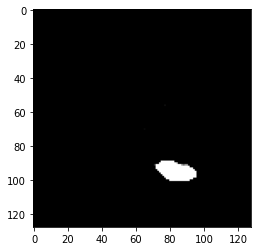

[200. 210. 220. 226. 228. 241. 244.]


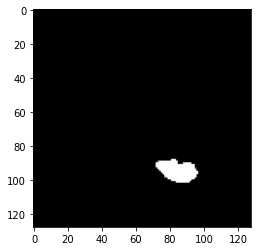

[109. 119. 121. 124. 132. 136. 138. 150. 154. 162. 163. 164. 167. 168.
 169. 170. 171. 172. 173. 174. 175. 176. 177. 178. 179. 180. 181. 182.
 183. 184. 185. 202. 213. 230. 231. 240. 245. 247.]


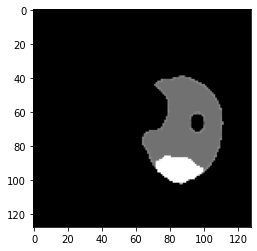

[210. 214. 215. 217. 231. 233. 238. 244. 249. 250.]


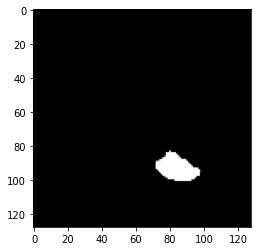

[100. 103. 106. 108. 118. 120. 121. 124. 125. 131. 136. 137. 138. 153.
 163. 168. 169. 170. 171. 172. 173. 174. 175. 176. 177. 178. 179. 180.
 181. 182. 183. 189. 191. 192. 199. 204. 205. 221. 223. 224. 227. 229.
 232. 234. 242. 249. 250.]


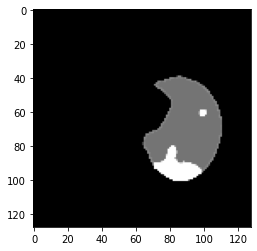

[193. 229. 230. 232. 234. 235. 240. 243. 247.]


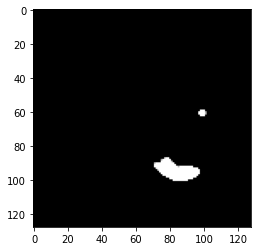

[107. 115. 116. 119. 122. 125. 126. 136. 142. 145. 153. 157. 158. 159.
 164. 168. 169. 170. 171. 172. 173. 174. 175. 176. 177. 178. 179. 180.
 181. 182. 183. 185. 186. 188. 190. 215. 217. 228. 237.]


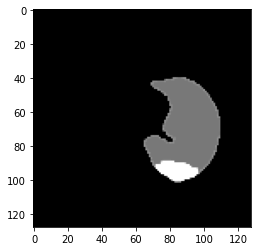

[109. 110. 113. 118. 119. 120. 121. 123. 126. 128. 134. 138. 143. 155.
 157. 164. 165. 169. 170. 171. 172. 173. 174. 175. 176. 177. 178. 179.
 180. 181. 182. 183. 184. 185. 186. 187. 188. 211. 218. 227. 232. 241.]


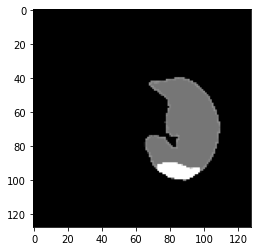

[120. 121. 123. 126. 129. 131. 132. 133. 134. 136. 148. 150. 153. 157.
 164. 166. 168. 169. 170. 171. 172. 173. 174. 175. 176. 177. 178. 179.
 180. 181. 182. 183. 184. 185. 186. 209. 211. 242.]


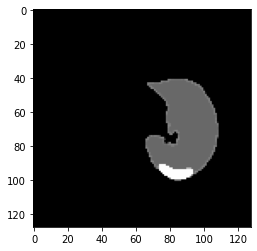

[144. 145. 146. 148. 150. 153. 158. 160. 188. 216. 226. 233. 235. 236.
 237. 240. 243. 245. 246. 247.]


KeyboardInterrupt: ignored

In [ ]:
for x in Y[index_array]:
  print(np.unique(x))
  plt.imshow(np.reshape(x,(128,128)), cmap=plt.cm.gray)
  aux=x
  aux[aux<=63]=0
  aux[aux<=63*2]=0
  plt.show()

In [ ]:
print(np.unique(Y[]))

[0.]


In [ ]:
Y=np.zeros((len(glob.glob(src+mas+"*.png"))-1,IMG_WIDTH,IMG_HEIGHT,2))
Y.shape

(3519, 128, 128, 2)

In [ ]:
src="/content/input/train"
imag="/images/"
Siz=0
dis=0
id=0
ri=0
metadat=[]
c="001"
i=0
for x in sorted(glob.glob(src+imag+"*.png")):
  if x =="/content/input/train/images/coronacases_009_149.png":
    continue
  if x.find("radiopaedia") == -1:
    x=x[x.find("_")+1:]
    x=x[:x.find("_")]
  else:
    x=x[x.find("_")+1:]
    x=x[:x.find("_",9)]
  if c!=x:
    print(x)
    metadat.append([id,Siz,ri])
    ri=i-dis
    c=x
    id+=1
    Siz=0
  if X[i,:,:,:].max()!=0:
    Siz+=1
  else:
    dis+=1
  i+=1
metadat.append([id,Siz,ri])

002
003
004
005
006
007
008
009
010
10_85902_1
10_85902_3
14_85914_0
27_86410_0
29_86490_1
29_86491_1
36_86526_0
40_86625_0
4_85506_1
7_85703_0


In [ ]:
from sklearn.model_selection import KFold
cv = KFold(n_splits=5, random_state=1, shuffle=True)
IDX=[x for x in range(10)]
IDY=[x for x in range(10)]
for train_index, val_index in cv.split(metadat,metadat):
  print(train_index, val_index)

[ 0  1  2  4  5  7  8  9 11 12 13 14 15 17 18 19] [ 3  6 10 16]
[ 0  1  3  5  6  7  8  9 10 11 12 13 15 16 18 19] [ 2  4 14 17]
[ 2  3  4  5  6  8  9 10 11 12 14 15 16 17 18 19] [ 0  1  7 13]
[ 0  1  2  3  4  5  6  7  8 10 11 12 13 14 16 17] [ 9 15 18 19]
[ 0  1  2  3  4  6  7  9 10 13 14 15 16 17 18 19] [ 5  8 11 12]


In [ ]:
for i,x in enumerate(train_index):
  size=metadat[x][1]
  ri=metadat[x][2]
  if i == 0:
    X_train=X[ri:ri+size]
    Y_train=Y[ri:ri+size]
  else:
    X_train=np.concatenate((X_train,X[ri:ri+size]),axis=0)
    Y_train=np.concatenate((Y_train,Y[ri:ri+size]),axis=0)
for i,x in enumerate(val_index):
  size=metadat[x][1]
  ri=metadat[x][2]
  if i == 0:
    X_test=X[ri:ri+size]
    Y_test=Y[ri:ri+size]
  else:
    X_test=np.concatenate((X_test,X[ri:ri+size]),axis=0)
    Y_test=np.concatenate((Y_test,Y[ri:ri+size]),axis=0)

In [ ]:

print(np.unique(Y_train))
print(Y_train.shape)
print(tf.keras.utils.to_categorical(Y_train).shape)
print(np.unique(Y_test))
print(Y_test.shape)

[0. 1.]
(2860, 128, 128, 3)
(2860, 128, 128, 3, 2)
[0. 1.]
(658, 128, 128, 3)


In [ ]:
from keras import backend as K
def iou_coef(y_true, y_pred, smooth=1):
  intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
  union = K.sum(y_true,[1,2,3])+K.sum(y_pred,[1,2,3])-intersection
  iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
  return iou
def dice_coef(y_true, y_pred, smooth=1):
  intersection = K.sum(y_true * y_pred, axis=[1,2,3])
  union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
  dice = K.mean((2. * intersection + smooth)/(union + smooth), axis=0)
  return dice

In [ ]:
def dice_coef_multilabel(y_true, y_pred, smooth=1):
    dice=0
    numLabels=y_true.shape[3]
    for index in range(numLabels):
      #None,128,128,1
      y_t=tf.expand_dims(y_true[:,:,:,index],axis=3)
      #None,128,128
      y_p=tf.expand_dims(y_pred[:,:,:,index],axis=3)
      dice += dice_coef(y_t, y_p)
    return dice/numLabels # taking average

In [ ]:
def iou_coef_multilabel(y_true, y_pred, smooth=1):
    dice=0
    numLabels=y_true.shape[3]
    for index in range(numLabels):
      y_t=tf.expand_dims(y_true[:,:,:,index],axis=3)
      y_p=tf.expand_dims(y_pred[:,:,:,index],axis=3)
      dice += iou_coef(y_t, y_p)
    return dice/numLabels # taking average

In [ ]:
import tensorflow as tf
def create_model():

  #Build the model
  inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)
  #s= inputs
  #Contraction path
  c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
  c1 = tf.keras.layers.Dropout(0.1)(c1)
  c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
  p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

  c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
  c2 = tf.keras.layers.Dropout(0.1)(c2)
  c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
  p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

  c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
  c3 = tf.keras.layers.Dropout(0.2)(c3)
  c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
  p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

  c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
  c4 = tf.keras.layers.Dropout(0.2)(c4)
  c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
  p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)

  c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
  c5 = tf.keras.layers.Dropout(0.3)(c5)
  c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

  #Expansive path
  u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
  u6 = tf.keras.layers.concatenate([u6, c4])
  c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
  c6 = tf.keras.layers.Dropout(0.2)(c6)
  c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

  u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
  u7 = tf.keras.layers.concatenate([u7, c3])
  c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
  c7 = tf.keras.layers.Dropout(0.2)(c7)
  c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

  u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
  u8 = tf.keras.layers.concatenate([u8, c2])
  c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
  c8 = tf.keras.layers.Dropout(0.1)(c8)
  c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

  u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
  u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
  c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
  c9 = tf.keras.layers.Dropout(0.1)(c9)
  c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

  outputs = tf.keras.layers.Conv2D(4, (1, 1), activation='softmax')(c9)

  model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
  model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy',iou_coef_multilabel,dice_coef_multilabel])
  #model.summary()
  return model

In [ ]:
model=create_model()
model.fit(X_train,Y_train,batch_size=16,epochs=25)

Epoch 1/25
158/158 [==============================] - 14s 46ms/step - loss: 0.2173 - accuracy: 0.9158 - iou_coef_multilabel: 0.3159 - dice_coef_multilabel: 0.3759
Epoch 2/25
158/158 [==============================] - 7s 45ms/step - loss: 0.0782 - accuracy: 0.9674 - iou_coef_multilabel: 0.4800 - dice_coef_multilabel: 0.5423
Epoch 3/25
158/158 [==============================] - 7s 46ms/step - loss: 0.0394 - accuracy: 0.9864 - iou_coef_multilabel: 0.6068 - dice_coef_multilabel: 0.6559
Epoch 4/25
158/158 [==============================] - 7s 46ms/step - loss: 0.0374 - accuracy: 0.9872 - iou_coef_multilabel: 0.6159 - dice_coef_multilabel: 0.6678
Epoch 5/25
158/158 [==============================] - 7s 46ms/step - loss: 0.0264 - accuracy: 0.9907 - iou_coef_multilabel: 0.6671 - dice_coef_multilabel: 0.7160
Epoch 6/25
158/158 [==============================] - 7s 47ms/step - loss: 0.0231 - accuracy: 0.9918 - iou_coef_multilabel: 0.7006 - dice_coef_multilabel: 0.7477
Epoch 7/25
158/158 [=======

In [ ]:
scores= model.evaluate(X_test, Y_test, verbose=0)
print(f'Score for fold {0}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}% {model.metrics_names[2]} of {scores[2]*100}% {model.metrics_names[3]} of {scores[3]*100}%')

Score for fold 0: loss of 0.053749557584524155; accuracy of 98.45772385597229% iou_coef_multilabel of 58.31095576286316% dice_coef_multilabel of 63.43512535095215%


In [ ]:
model=create_model()
model.fit(X_train,Y_train,batch_size=16,epochs=50)

Epoch 1/50
158/158 [==============================] - 24s 50ms/step - loss: 0.3093 - accuracy: 0.8594 - iou_coef: 0.7618 - dice_coef: 0.8380
Epoch 2/50
158/158 [==============================] - 7s 44ms/step - loss: 0.0682 - accuracy: 0.9719 - iou_coef: 0.9292 - dice_coef: 0.9622
Epoch 3/50
158/158 [==============================] - 7s 44ms/step - loss: 0.0287 - accuracy: 0.9900 - iou_coef: 0.9705 - dice_coef: 0.9849
Epoch 4/50
158/158 [==============================] - 7s 44ms/step - loss: 0.0246 - accuracy: 0.9913 - iou_coef: 0.9746 - dice_coef: 0.9870
Epoch 5/50
158/158 [==============================] - 7s 44ms/step - loss: 0.0218 - accuracy: 0.9922 - iou_coef: 0.9771 - dice_coef: 0.9883
Epoch 6/50
158/158 [==============================] - 7s 45ms/step - loss: 0.0193 - accuracy: 0.9930 - iou_coef: 0.9794 - dice_coef: 0.9895
Epoch 7/50
158/158 [==============================] - 7s 45ms/step - loss: 0.0182 - accuracy: 0.9933 - iou_coef: 0.9806 - dice_coef: 0.9901
Epoch 8/50
158/158 

32/32 [==============================] - 1s 19ms/step
(995, 128, 128, 4)
[0. 1.]


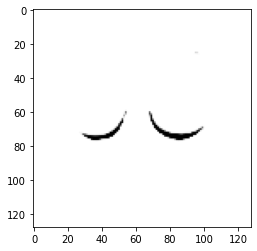

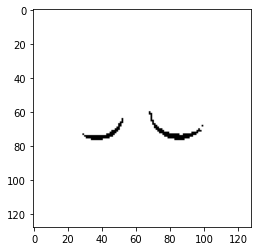

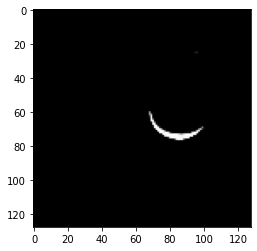

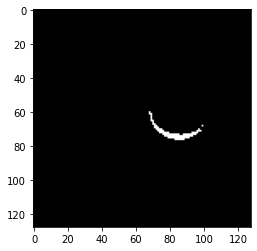

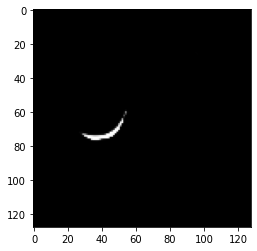

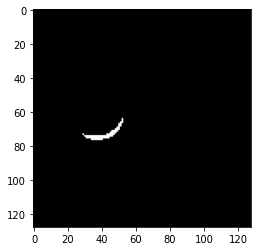

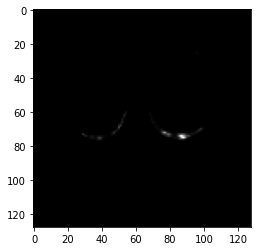

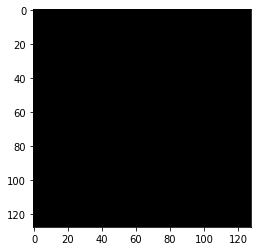

In [ ]:
import random
Ypred=model.predict(X_test)
print(Ypred.shape)
rid=random.randint(0,Ypred.shape[0]-1)
print(np.unique(Y_test[rid]))
plt.imshow(np.reshape(Ypred[rid,:,:,0],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Y_test[rid,:,:,0],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Ypred[rid,:,:,1],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Y_test[rid,:,:,1],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Ypred[rid,:,:,2],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Y_test[rid,:,:,2],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Ypred[rid,:,:,3],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Y_test[rid,:,:,3],(128,128)), cmap=plt.cm.gray)
plt.show()


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from numpy import mean
from numpy import absolute
from numpy import sqrt
import pandas as pd
cv = KFold(n_splits=5, shuffle=True)

In [ ]:
VALIDATION_ACCURACY = []
VALIDAITON_LOSS = []
nfold=1
for train_index, val_index in cv.split(metadat,metadat):
  model = create_model()
  for i,x in enumerate(train_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      X_fold=X[ri:ri+size]
      Y_fold=Y[ri:ri+size]
    else:
      X_fold=np.concatenate((X_fold,X[ri:ri+size]),axis=0)
      Y_fold=np.concatenate((Y_fold,Y[ri:ri+size]),axis=0)
  for i,x in enumerate(val_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      Xtest_fold=X[ri:ri+size]
      Ytest_fold=Y[ri:ri+size]
    else:
      Xtest_fold=np.concatenate((Xtest_fold,X[ri:ri+size]),axis=0)
      Ytest_fold=np.concatenate((Ytest_fold,Y[ri:ri+size]),axis=0)

  model.fit(X_fold,Y_fold,batch_size=16,epochs=25,verbose=0)

  scores= model.evaluate(Xtest_fold, Ytest_fold, verbose=0)
  print(f'Score for fold {nfold}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}% {model.metrics_names[2]} of {scores[2]*100}% {model.metrics_names[3]} of {scores[3]*100}%')
  nfold+=1

Score for fold 1: loss of 0.01773880235850811; accuracy of 99.37904477119446% iou_coef_multilabel of 69.88361477851868% dice_coef_multilabel of 73.54679107666016%
Score for fold 2: loss of 0.031780142337083817; accuracy of 99.0174651145935% iou_coef_multilabel of 79.80746626853943% dice_coef_multilabel of 84.323251247406%
Score for fold 3: loss of 0.022051522508263588; accuracy of 99.31426644325256% iou_coef_multilabel of 74.23953413963318% dice_coef_multilabel of 78.19526791572571%
Score for fold 4: loss of 0.03958631306886673; accuracy of 98.5733687877655% iou_coef_multilabel of 67.02992916107178% dice_coef_multilabel of 72.25984930992126%
Score for fold 5: loss of 0.03437061235308647; accuracy of 98.79676103591919% iou_coef_multilabel of 76.98976397514343% dice_coef_multilabel of 82.60183334350586%


In [ ]:
VALIDATION_ACCURACY = []
VALIDAITON_LOSS = []
nfold=1
for train_index, val_index in cv.split(metadat,metadat):
  model = create_model()
  for i,x in enumerate(train_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      X_fold=X[ri:ri+size]
      Y_fold=Y[ri:ri+size]
    else:
      X_fold=np.concatenate((X_fold,X[ri:ri+size]),axis=0)
      Y_fold=np.concatenate((Y_fold,Y[ri:ri+size]),axis=0)
  for i,x in enumerate(val_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      Xtest_fold=X[ri:ri+size]
      Ytest_fold=Y[ri:ri+size]
    else:
      Xtest_fold=np.concatenate((Xtest_fold,X[ri:ri+size]),axis=0)
      Ytest_fold=np.concatenate((Ytest_fold,Y[ri:ri+size]),axis=0)

  model.fit(X_fold,Y_fold,batch_size=16,epochs=50,verbose=0)

  scores= model.evaluate(Xtest_fold, Ytest_fold, verbose=0)
  print(f'Score for fold {nfold}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}% {model.metrics_names[2]} of {scores[2]*100}% {model.metrics_names[3]} of {scores[3]*100}%')
  nfold+=1

Score for fold 1: loss of 0.01420969795435667; accuracy of 99.53237771987915% iou_coef_multilabel of 80.17311096191406% dice_coef_multilabel of 83.62116813659668%
Score for fold 2: loss of 0.020025374367833138; accuracy of 99.36167001724243% iou_coef_multilabel of 81.57233595848083% dice_coef_multilabel of 84.61194634437561%
Score for fold 3: loss of 0.021327318623661995; accuracy of 99.26793575286865% iou_coef_multilabel of 71.37790322303772% dice_coef_multilabel of 75.44917464256287%
Score for fold 4: loss of 0.04195620119571686; accuracy of 98.48132729530334% iou_coef_multilabel of 67.71218180656433% dice_coef_multilabel of 74.54234957695007%
Score for fold 5: loss of 0.010438746772706509; accuracy of 99.62964057922363% iou_coef_multilabel of 81.27319812774658% dice_coef_multilabel of 83.99603366851807%


Test 1 50 fold:

Score for fold 1: loss of 0.019205430522561073; accuracy of 99.28767085075378% iou_coef_multilabel of 80.9702455997467% dice_coef_multilabel of 85.34740209579468%

Score for fold 2: loss of 0.03531940281391144; accuracy of 98.92992973327637% iou_coef_multilabel of 78.66089344024658% dice_coef_multilabel of 83.7219774723053%

Score for fold 3: loss of 0.013304217718541622; accuracy of 99.54023957252502% iou_coef_multilabel of 81.64749145507812% dice_coef_multilabel of 84.39385890960693%

Score for fold 4: loss of 0.02654096484184265; accuracy of 99.14758205413818% iou_coef_multilabel of 71.3643491268158% dice_coef_multilabel of 75.49737691879272%

Score for fold 5: loss of 0.03037772700190544; accuracy of 99.15972948074341% iou_coef_multilabel of 79.57197427749634% dice_coef_multilabel of 83.53084921836853%

Test 2 50 fold:

Score for fold 1: loss of 0.01420969795435667; accuracy of 99.53237771987915% iou_coef_multilabel of 80.17311096191406% dice_coef_multilabel of 83.62116813659668%

Score for fold 2: loss of 0.020025374367833138; accuracy of 99.36167001724243% iou_coef_multilabel of 81.57233595848083% dice_coef_multilabel of 84.61194634437561%

Score for fold 3: loss of 0.021327318623661995; accuracy of 99.26793575286865% iou_coef_multilabel of 71.37790322303772% dice_coef_multilabel of 75.44917464256287%

Score for fold 4: loss of 0.04195620119571686; accuracy of 98.48132729530334% iou_coef_multilabel of 67.71218180656433% dice_coef_multilabel of 74.54234957695007%

Score for fold 5: loss of 0.010438746772706509; accuracy of 99.62964057922363% iou_coef_multilabel of 81.27319812774658% dice_coef_multilabel of 83.99603366851807%



23/23 [==============================] - 0s 20ms/step
(709, 128, 128, 4)
[0. 1.]


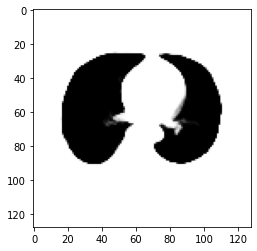

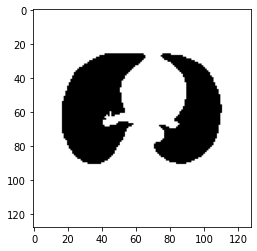

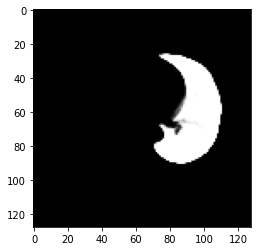

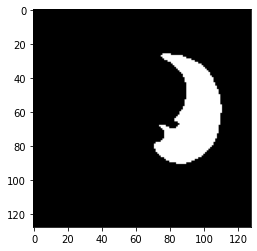

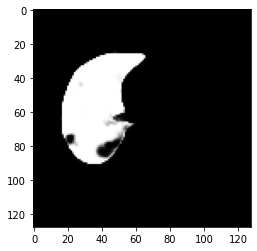

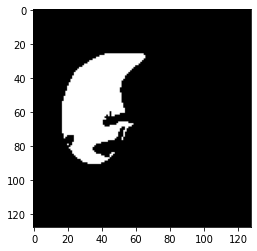

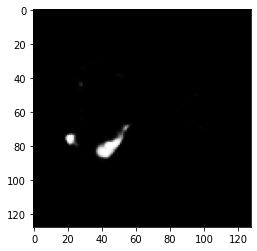

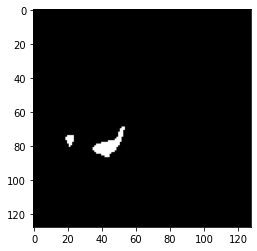

In [ ]:
import random
Ypred=model.predict(Xtest_fold)
print(Ypred.shape)
rid=random.randint(0,Ypred.shape[0]-1)
print(np.unique(Ytest_fold[rid]))
plt.imshow(np.reshape(Ypred[rid,:,:,0],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Ytest_fold[rid,:,:,0],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Ypred[rid,:,:,1],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Ytest_fold[rid,:,:,1],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Ypred[rid,:,:,2],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Ytest_fold[rid,:,:,2],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Ypred[rid,:,:,3],(128,128)), cmap=plt.cm.gray)
plt.show()
plt.imshow(np.reshape(Ytest_fold[rid,:,:,3],(128,128)), cmap=plt.cm.gray)
plt.show()


In [ ]:
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

#Unet with data augmentation

In [ ]:
!gdown "1KJPU1D0ewHmU7Jzl1irq3Gb-JkUqV1VR&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1KJPU1D0ewHmU7Jzl1irq3Gb-JkUqV1VR&confirm=t
To: /content/input.zip
100% 367M/367M [00:02<00:00, 140MB/s]


In [ ]:
!unzip -q input.zip

In [ ]:
IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 1

In [ ]:
!pip install visualkeras

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.0/993.0 kB 1.0 MB/s eta 0:00:00


In [ ]:
import nibabel as nib
import os
import numpy as np
from nibabel.testing import data_path
import matplotlib.pyplot as plt
import cv2
import torch

In [ ]:
import imageio as iio
import glob
from skimage.transform import resize
import PIL
from PIL import Image
src="/content/input/train"
imag="/images/"
X=np.zeros((len(glob.glob(src+imag+"*.png")),IMG_WIDTH,IMG_HEIGHT,1))
for i,x in enumerate(sorted(glob.glob(src+imag+"*.png"))):
  if x!="/content/input/train/images/coronacases_009_149.png":
    im=Image.open(x)
    X[i,:,:,0]=im.resize((IMG_WIDTH,IMG_HEIGHT),resample=PIL.Image.NEAREST)
mas="/Amasks/"
Y=np.zeros((len(glob.glob(src+mas+"*.png")),IMG_WIDTH,IMG_HEIGHT))
for i,x in enumerate(sorted(glob.glob(src+mas+"*.png"))):
  if x!="/content/input/train/Amasks/coronacases_009_149.png":
    im=Image.open(x)
    im=np.array(im.resize((IMG_WIDTH,IMG_HEIGHT),resample=PIL.Image.NEAREST))
    im[im==85]=1
    im[im==170]=2
    im[im==255]=3
    Y[i,:,:]=im
import tensorflow as tf
print(Y.shape)
print(np.unique(Y))
Y=tf.keras.utils.to_categorical(Y)
print(Y.shape)
print(np.unique(Y))

(3520, 128, 128)
[0. 1. 2. 3.]
(3520, 128, 128, 4)
[0. 1.]


In [ ]:
src="/content/input/train"
imag="/images/"
Siz=0
id=0
ri=0
metadat=[]
c="001"
for i,x in enumerate(sorted(glob.glob(src+imag+"*.png"))):
  if x.find("radiopaedia") == -1:
    x=x[x.find("_")+1:]
    x=x[:x.find("_")]
  else:
    x=x[x.find("_")+1:]
    x=x[:x.find("_",9)]
  if c!=x:
    print(x)
    metadat.append([id,Siz,ri])
    ri=i
    c=x
    id+=1
    Siz=0
  Siz+=1
metadat.append([id,Siz,ri])

002
003
004
005
006
007
008
009
010
10_85902_1
10_85902_3
14_85914_0
27_86410_0
29_86490_1
29_86491_1
36_86526_0
40_86625_0
4_85506_1
7_85703_0


##New Split

In [ ]:
from sklearn.model_selection import KFold
cv = KFold(n_splits=5, random_state=1, shuffle=True)
IDX=[x for x in range(10)]
IDY=[x for x in range(10)]
for train_index, val_index in cv.split(metadat,metadat):
  print(train_index, val_index)

[ 0  1  2  4  5  7  8  9 11 12 13 14 15 17 18 19] [ 3  6 10 16]
[ 0  1  3  5  6  7  8  9 10 11 12 13 15 16 18 19] [ 2  4 14 17]
[ 2  3  4  5  6  8  9 10 11 12 14 15 16 17 18 19] [ 0  1  7 13]
[ 0  1  2  3  4  5  6  7  8 10 11 12 13 14 16 17] [ 9 15 18 19]
[ 0  1  2  3  4  6  7  9 10 13 14 15 16 17 18 19] [ 5  8 11 12]


In [ ]:
for i,x in enumerate(train_index):
  size=metadat[x][1]
  ri=metadat[x][2]
  if i == 0:
    X_train=X[ri:ri+size]
    Y_train=Y[ri:ri+size]
  else:
    X_train=np.concatenate((X_train,X[ri:ri+size]),axis=0)
    Y_train=np.concatenate((Y_train,Y[ri:ri+size]),axis=0)
for i,x in enumerate(val_index):
  size=metadat[x][1]
  ri=metadat[x][2]
  if i == 0:
    X_test=X[ri:ri+size]
    Y_test=Y[ri:ri+size]
  else:
    X_test=np.concatenate((X_test,X[ri:ri+size]),axis=0)
    Y_test=np.concatenate((Y_test,Y[ri:ri+size]),axis=0)

## model

In [ ]:
from keras import backend as K
def iou_coef(y_true, y_pred, smooth=1):
  intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
  union = K.sum(y_true,[1,2,3])+K.sum(y_pred,[1,2,3])-intersection
  iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
  return iou
def dice_coef(y_true, y_pred, smooth=1):
  intersection = K.sum(y_true * y_pred, axis=[1,2,3])
  union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
  dice = K.mean((2. * intersection + smooth)/(union + smooth), axis=0)
  return dice

In [ ]:
def dice_coef_multilabel(y_true, y_pred, smooth=1):
    dice=0
    numLabels=y_true.shape[3]
    for index in range(numLabels):
      #None,128,128,1
      y_t=tf.expand_dims(y_true[:,:,:,index],axis=3)
      #None,128,128
      y_p=tf.expand_dims(y_pred[:,:,:,index],axis=3)
      dice += dice_coef(y_t, y_p)
    return dice/numLabels # taking average

In [ ]:
def iou_coef_multilabel(y_true, y_pred, smooth=1):
    dice=0
    numLabels=y_true.shape[3]
    for index in range(numLabels):
      y_t=tf.expand_dims(y_true[:,:,:,index],axis=3)
      y_p=tf.expand_dims(y_pred[:,:,:,index],axis=3)
      dice += iou_coef(y_t, y_p)
    return dice/numLabels # taking average

In [ ]:
import tensorflow as tf
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip("vertical"),
  tf.keras.layers.RandomRotation(0.1),
])

In [ ]:
import tensorflow as tf
def create_model():

  #Build the model
  inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)
  #s= inputs
  #Contraction path
  c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
  c1 = tf.keras.layers.Dropout(0.1)(c1)
  c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
  p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

  c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
  c2 = tf.keras.layers.Dropout(0.1)(c2)
  c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
  p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

  c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
  c3 = tf.keras.layers.Dropout(0.2)(c3)
  c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
  p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

  c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
  c4 = tf.keras.layers.Dropout(0.2)(c4)
  c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
  p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)

  c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
  c5 = tf.keras.layers.Dropout(0.3)(c5)
  c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

  #Expansive path
  u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
  u6 = tf.keras.layers.concatenate([u6, c4])
  c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
  c6 = tf.keras.layers.Dropout(0.2)(c6)
  c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

  u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
  u7 = tf.keras.layers.concatenate([u7, c3])
  c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
  c7 = tf.keras.layers.Dropout(0.2)(c7)
  c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

  u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
  u8 = tf.keras.layers.concatenate([u8, c2])
  c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
  c8 = tf.keras.layers.Dropout(0.1)(c8)
  c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

  u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
  u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
  c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
  c9 = tf.keras.layers.Dropout(0.1)(c9)
  c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

  outputs = tf.keras.layers.Conv2D(4, (1, 1), activation='softmax')(c9)

  model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
  model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=[tf.keras.metrics.CategoricalAccuracy(),iou_coef_multilabel,dice_coef_multilabel])
  #model.summary()
  return model

In [ ]:
train_data = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
# Apply the data augmentation pipeline to both X_train and Y_train
X__2 = np.concatenate([X_train, Y_train], axis=-1)
X__2 = tf.data.Dataset.from_tensor_slices((X__2))
augmented_train_data = X__2.map(lambda x: data_augmentation(x, training=True))

# Separate X_train and Y_train from the augmented train data
X_train_augmented = augmented_train_data.map(lambda x: x)
X_train_augmented = np.asarray(list(X_train_augmented.as_numpy_iterator()))
Y_train_augmented = X_train_augmented[:,:,:,1:5]
X_train_augmented = X_train_augmented[:,:,:,0]
X_train_combined = np.concatenate([X_train, X_train_augmented[:,:,:,None]], axis=0)
Y_train_combined = np.concatenate([Y_train, Y_train_augmented], axis=0)

In [ ]:
model=create_model()
history=model.fit(X_train,Y_train,batch_size=16,epochs=25)

Epoch 1/25
158/158 [==============================] - 23s 22ms/step - loss: 0.2047 - categorical_accuracy: 0.9139 - iou_coef_multilabel: 0.3265 - dice_coef_multilabel: 0.3886
Epoch 2/25
158/158 [==============================] - 2s 16ms/step - loss: 0.0582 - categorical_accuracy: 0.9812 - iou_coef_multilabel: 0.5388 - dice_coef_multilabel: 0.5979
Epoch 3/25
158/158 [==============================] - 2s 15ms/step - loss: 0.0306 - categorical_accuracy: 0.9895 - iou_coef_multilabel: 0.6494 - dice_coef_multilabel: 0.6978
Epoch 4/25
158/158 [==============================] - 2s 14ms/step - loss: 0.0241 - categorical_accuracy: 0.9914 - iou_coef_multilabel: 0.6891 - dice_coef_multilabel: 0.7359
Epoch 5/25
158/158 [==============================] - 2s 15ms/step - loss: 0.0208 - categorical_accuracy: 0.9924 - iou_coef_multilabel: 0.7219 - dice_coef_multilabel: 0.7673
Epoch 6/25
158/158 [==============================] - 2s 15ms/step - loss: 0.0192 - categorical_accuracy: 0.9929 - iou_coef_multi

In [ ]:
model=create_model()
history=model.fit(X_train_combined,Y_train_combined,batch_size=16,epochs=25)

Epoch 1/25
316/316 [==============================] - 25s 17ms/step - loss: 0.2496 - categorical_accuracy: 0.9205 - iou_coef_multilabel: 0.3107 - dice_coef_multilabel: 0.3656
Epoch 2/25
316/316 [==============================] - 4s 14ms/step - loss: 0.1196 - categorical_accuracy: 0.9592 - iou_coef_multilabel: 0.4465 - dice_coef_multilabel: 0.5100
Epoch 3/25
316/316 [==============================] - 4s 14ms/step - loss: 0.0884 - categorical_accuracy: 0.9681 - iou_coef_multilabel: 0.5153 - dice_coef_multilabel: 0.5797
Epoch 4/25
316/316 [==============================] - 4s 14ms/step - loss: 0.0696 - categorical_accuracy: 0.9741 - iou_coef_multilabel: 0.5702 - dice_coef_multilabel: 0.6335
Epoch 5/25
316/316 [==============================] - 4s 14ms/step - loss: 0.0594 - categorical_accuracy: 0.9777 - iou_coef_multilabel: 0.6028 - dice_coef_multilabel: 0.6635
Epoch 6/25
316/316 [==============================] - 4s 14ms/step - loss: 0.0514 - categorical_accuracy: 0.9804 - iou_coef_multi

In [ ]:
print(history.history)

{'loss': [0.2495582103729248, 0.11959759145975113, 0.08835947513580322, 0.06957565248012543, 0.059384122490882874, 0.05144081264734268, 0.04724336788058281, 0.04418947547674179, 0.04127643257379532, 0.03879798576235771, 0.037699926644563675, 0.03658989071846008, 0.03488291800022125, 0.03406279906630516, 0.03285128250718117, 0.03301455080509186, 0.0316091887652874, 0.03054715506732464, 0.029803644865751266, 0.029424576088786125, 0.029274340718984604, 0.02904096245765686, 0.028463006019592285, 0.02810642309486866, 0.027503211051225662], 'categorical_accuracy': [0.9204661846160889, 0.9591653347015381, 0.9680768847465515, 0.9740700125694275, 0.9777195453643799, 0.980411946773529, 0.9818674921989441, 0.9829402565956116, 0.9839666485786438, 0.9848108291625977, 0.9852337837219238, 0.9856523871421814, 0.9862369894981384, 0.9865472912788391, 0.9869945645332336, 0.9869295358657837, 0.987433671951294, 0.9878103733062744, 0.98809814453125, 0.9882304668426514, 0.9883071780204773, 0.9883813858032227

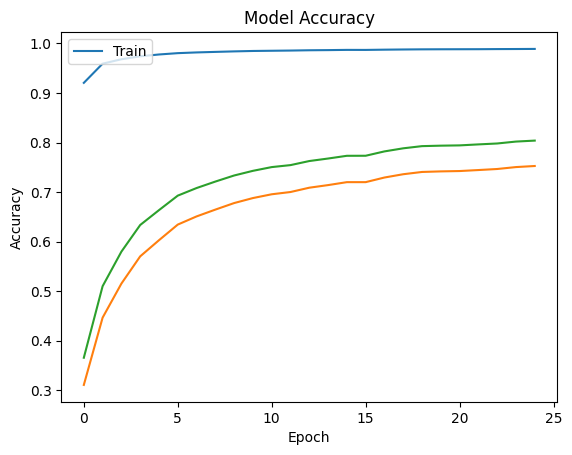

In [ ]:
plt.plot(history.history["categorical_accuracy"])
plt.plot(history.history["iou_coef_multilabel"])
plt.plot(history.history["dice_coef_multilabel"])
plt.title("Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend(["Train"], loc="upper left")
plt.show()

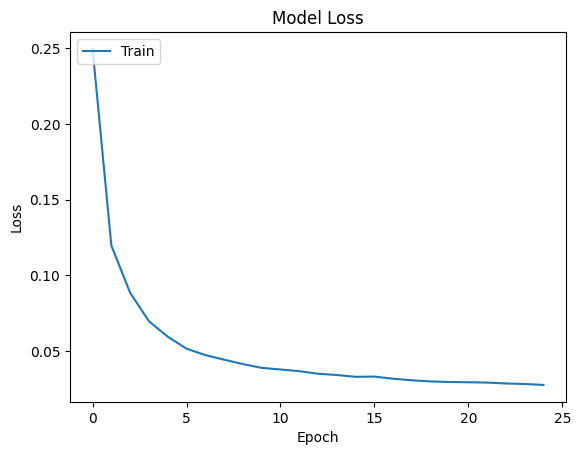

In [ ]:
plt.plot(history.history["loss"])
plt.title("Model Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend(["Train", "Validation"], loc="upper left")
plt.show()

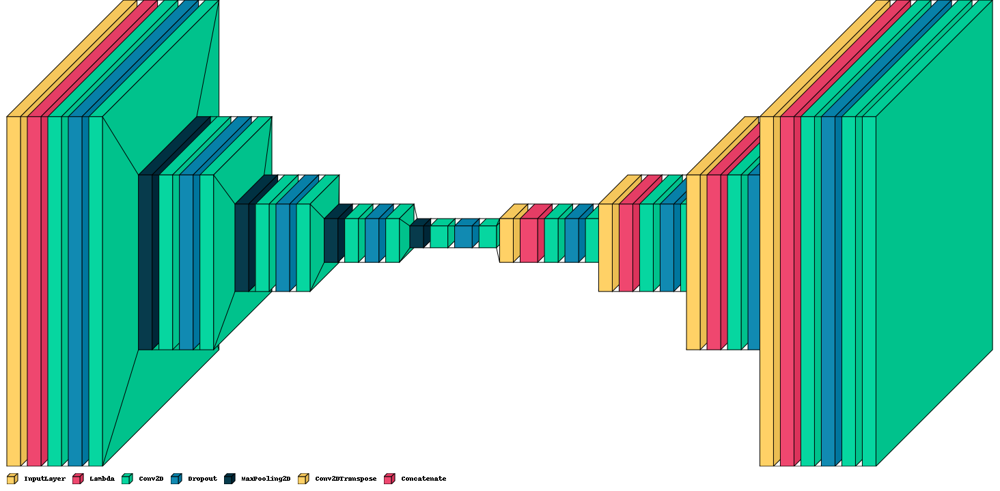

In [ ]:

import visualkeras
visualkeras.layered_view(model,legend=True).show()

In [ ]:
model=create_model()
history=model.fit(X_train_combined,Y_train_combined,batch_size=16,epochs=25)

Epoch 1/25
316/316 [==============================] - 26s 55ms/step - loss: 0.2599 - accuracy: 0.9067 - iou_coef_multilabel: 0.3002 - dice_coef_multilabel: 0.3570
Epoch 2/25
316/316 [==============================] - 16s 50ms/step - loss: 0.1122 - accuracy: 0.9606 - iou_coef_multilabel: 0.4633 - dice_coef_multilabel: 0.5287
Epoch 3/25
316/316 [==============================] - 15s 49ms/step - loss: 0.0810 - accuracy: 0.9703 - iou_coef_multilabel: 0.5432 - dice_coef_multilabel: 0.6077
Epoch 4/25
316/316 [==============================] - 16s 50ms/step - loss: 0.0667 - accuracy: 0.9751 - iou_coef_multilabel: 0.5826 - dice_coef_multilabel: 0.6442
Epoch 5/25
316/316 [==============================] - 16s 50ms/step - loss: 0.0568 - accuracy: 0.9784 - iou_coef_multilabel: 0.6173 - dice_coef_multilabel: 0.6771
Epoch 6/25
316/316 [==============================] - 15s 49ms/step - loss: 0.0511 - accuracy: 0.9805 - iou_coef_multilabel: 0.6391 - dice_coef_multilabel: 0.6974
Epoch 7/25
316/316 [==

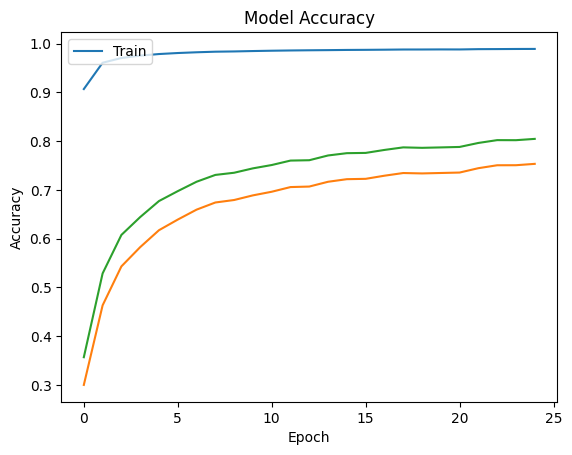

In [ ]:
plt.plot(history.history["accuracy"])
plt.plot(history.history["iou_coef_multilabel"])
plt.plot(history.history["dice_coef_multilabel"])
plt.title("Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend(["Train"], loc="upper left")
plt.show()

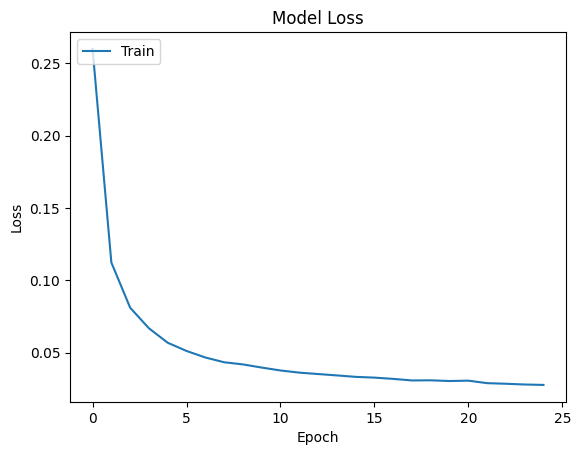

In [ ]:
plt.plot(history.history["loss"])
plt.title("Model Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend(["Train", "Validation"], loc="upper left")
plt.show()

In [ ]:
model=create_model()
history=model.fit(X_train,Y_train,batch_size=16,epochs=50)

Epoch 1/50
158/158 [==============================] - 11s 21ms/step - loss: 0.2826 - categorical_accuracy: 0.8751 - iou_coef_multilabel: 0.3060 - dice_coef_multilabel: 0.3643
Epoch 2/50
158/158 [==============================] - 2s 15ms/step - loss: 0.0982 - categorical_accuracy: 0.9520 - iou_coef_multilabel: 0.4104 - dice_coef_multilabel: 0.4796
Epoch 3/50
158/158 [==============================] - 2s 15ms/step - loss: 0.0686 - categorical_accuracy: 0.9751 - iou_coef_multilabel: 0.5172 - dice_coef_multilabel: 0.5719
Epoch 4/50
158/158 [==============================] - 2s 14ms/step - loss: 0.0333 - categorical_accuracy: 0.9877 - iou_coef_multilabel: 0.6228 - dice_coef_multilabel: 0.6719
Epoch 5/50
158/158 [==============================] - 2s 14ms/step - loss: 0.0257 - categorical_accuracy: 0.9908 - iou_coef_multilabel: 0.6659 - dice_coef_multilabel: 0.7146
Epoch 6/50
158/158 [==============================] - 2s 15ms/step - loss: 0.0234 - categorical_accuracy: 0.9916 - iou_coef_multi

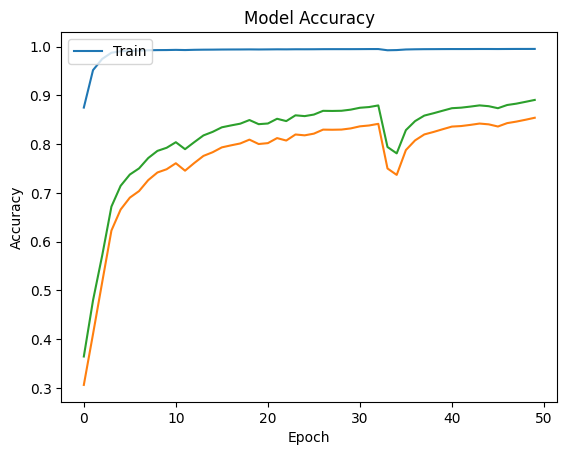

In [ ]:
plt.plot(history.history["categorical_accuracy"])
plt.plot(history.history["iou_coef_multilabel"])
plt.plot(history.history["dice_coef_multilabel"])
plt.title("Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend(["Train"], loc="upper left")
plt.show()

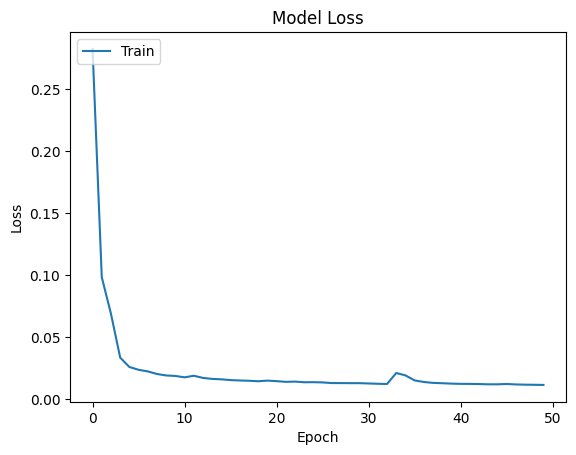

In [ ]:
plt.plot(history.history["loss"])
plt.title("Model Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend(["Train", "Validation"], loc="upper left")
plt.show()

In [ ]:
model=create_model()
history=model.fit(X_train_combined,Y_train_combined,batch_size=32,epochs=50)

Epoch 1/50
158/158 [==============================] - 15s 28ms/step - loss: 0.2527 - categorical_accuracy: 0.9088 - iou_coef_multilabel: 0.2857 - dice_coef_multilabel: 0.3378
Epoch 2/50
158/158 [==============================] - 3s 19ms/step - loss: 0.1574 - categorical_accuracy: 0.9470 - iou_coef_multilabel: 0.3843 - dice_coef_multilabel: 0.4473
Epoch 3/50
158/158 [==============================] - 3s 19ms/step - loss: 0.0991 - categorical_accuracy: 0.9639 - iou_coef_multilabel: 0.4956 - dice_coef_multilabel: 0.5591
Epoch 4/50
158/158 [==============================] - 3s 19ms/step - loss: 0.0768 - categorical_accuracy: 0.9717 - iou_coef_multilabel: 0.5526 - dice_coef_multilabel: 0.6163
Epoch 5/50
158/158 [==============================] - 3s 19ms/step - loss: 0.0659 - categorical_accuracy: 0.9753 - iou_coef_multilabel: 0.5873 - dice_coef_multilabel: 0.6494
Epoch 6/50
158/158 [==============================] - 3s 19ms/step - loss: 0.0563 - categorical_accuracy: 0.9787 - iou_coef_multi

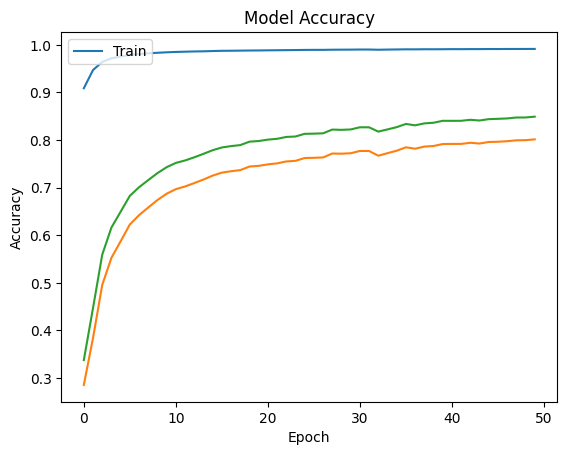

In [ ]:
plt.plot(history.history["categorical_accuracy"])
plt.plot(history.history["iou_coef_multilabel"])
plt.plot(history.history["dice_coef_multilabel"])
plt.title("Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend(["Train"], loc="upper left")
plt.show()

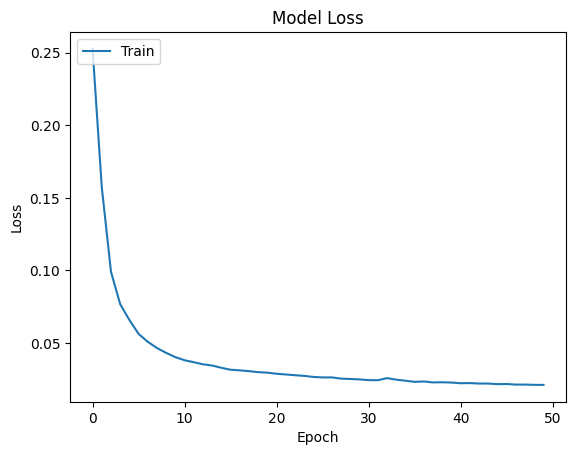

In [ ]:
plt.plot(history.history["loss"])
plt.title("Model Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend(["Train", "Validation"], loc="upper left")
plt.show()

In [ ]:
VALIDATION_ACCURACY = []
VALIDAITON_LOSS = []
nfold=1
for train_index, val_index in cv.split(metadat,metadat):
  model = create_model()
  for i,x in enumerate(train_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      X_fold=X[ri:ri+size]
      Y_fold=Y[ri:ri+size]
    else:
      X_fold=np.concatenate((X_fold,X[ri:ri+size]),axis=0)
      Y_fold=np.concatenate((Y_fold,Y[ri:ri+size]),axis=0)
  for i,x in enumerate(val_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      Xtest_fold=X[ri:ri+size]
      Ytest_fold=Y[ri:ri+size]
    else:
      Xtest_fold=np.concatenate((Xtest_fold,X[ri:ri+size]),axis=0)
      Ytest_fold=np.concatenate((Ytest_fold,Y[ri:ri+size]),axis=0)
  train_data = tf.data.Dataset.from_tensor_slices((X_fold, Y_fold))
  # Apply the data augmentation pipeline to both X_train and Y_train
  augmented_train_data = train_data.map(lambda x, y: (data_augmentation(x, training=True), y))

  # Separate X_train and Y_train from the augmented train data
  X_train_augmented = augmented_train_data.map(lambda x, y: x)
  Y_train_augmented = augmented_train_data.map(lambda x, y: y)

  X_train_augmented = np.asarray(list(X_train_augmented.as_numpy_iterator()))
  Y_train_augmented = np.asarray(list(Y_train_augmented.as_numpy_iterator()))

  X_train_combined = np.concatenate([X_fold, X_train_augmented], axis=0)
  Y_train_combined = np.concatenate([Y_fold, Y_train_augmented], axis=0)
  model.fit(X_train_combined,Y_train_combined,batch_size=16,epochs=50,verbose=0)

  scores= model.evaluate(Xtest_fold, Ytest_fold, verbose=0)
  print(f'Score for fold {nfold}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}% {model.metrics_names[2]} of {scores[2]*100}% {model.metrics_names[3]} of {scores[3]*100}%')
  nfold+=1

Score for fold 1: loss of 0.017271263524889946; accuracy of 99.42727088928223% iou_coef_multilabel of 81.5598726272583% dice_coef_multilabel of 84.461110830307%
Score for fold 2: loss of 0.043998587876558304; accuracy of 98.772531747818% iou_coef_multilabel of 80.7030200958252% dice_coef_multilabel of 85.33523678779602%
Score for fold 3: loss of 0.029043225571513176; accuracy of 99.1978406906128% iou_coef_multilabel of 79.70466017723083% dice_coef_multilabel of 83.81608724594116%
Score for fold 4: loss of 0.0334230475127697; accuracy of 98.87021780014038% iou_coef_multilabel of 78.52640151977539% dice_coef_multilabel of 83.73270034790039%
Score for fold 5: loss of 0.03336922451853752; accuracy of 99.02024865150452% iou_coef_multilabel of 75.3677248954773% dice_coef_multilabel of 78.96448373794556%


Score for fold 1: loss of 0.019387371838092804; accuracy of 99.383544921875% iou_coef_multilabel of 82.87447094917297% dice_coef_multilabel of 85.75816750526428%


Score for fold 2: loss of 0.034322720021009445; accuracy of 98.97236227989197% iou_coef_multilabel of 82.15080499649048% dice_coef_multilabel of 86.47260665893555%


Score for fold 3: loss of 0.030293770134449005; accuracy of 99.14392828941345% iou_coef_multilabel of 77.5046169757843% dice_coef_multilabel of 81.67530298233032%


Score for fold 4: loss of 0.03399152681231499; accuracy of 98.79366159439087% iou_coef_multilabel of 77.16894745826721% dice_coef_multilabel of 82.54929780960083%


Score for fold 5: loss of 0.042642563581466675; accuracy of 99.04577732086182% iou_coef_multilabel of 74.74514842033386% dice_coef_multilabel of 78.35192680358887%

2:

Score for fold 1: loss of 0.017271263524889946; accuracy of 99.42727088928223% iou_coef_multilabel of 81.5598726272583% dice_coef_multilabel of 84.461110830307%

Score for fold 2: loss of 0.043998587876558304; accuracy of 98.772531747818% iou_coef_multilabel of 80.7030200958252% dice_coef_multilabel of 85.33523678779602%

Score for fold 3: loss of 0.029043225571513176; accuracy of 99.1978406906128% iou_coef_multilabel of 79.70466017723083% dice_coef_multilabel of 83.81608724594116%

Score for fold 4: loss of 0.0334230475127697; accuracy of 98.87021780014038% iou_coef_multilabel of 78.52640151977539% dice_coef_multilabel of 83.73270034790039%

Score for fold 5: loss of 0.03336922451853752; accuracy of 99.02024865150452% iou_coef_multilabel of 75.3677248954773% dice_coef_multilabel of 78.96448373794556%

##Model data augmented kfold

In [ ]:
import tensorflow as tf
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip("vertical"),
  tf.keras.layers.RandomRotation(0.1),
])

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from numpy import mean
from numpy import absolute
from numpy import sqrt
import pandas as pd

In [ ]:
cv = KFold(n_splits=5, random_state=1, shuffle=True)

In [ ]:
VALIDATION_ACCURACY = []
VALIDAITON_LOSS = []
nfold=1
for train_index, val_index in cv.split(metadat,metadat):
  model = create_model()
  for i,x in enumerate(train_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      X_fold=X[ri:ri+size]
      Y_fold=Y[ri:ri+size]
    else:
      X_fold=np.concatenate((X_fold,X[ri:ri+size]),axis=0)
      Y_fold=np.concatenate((Y_fold,Y[ri:ri+size]),axis=0)
  for i,x in enumerate(val_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      Xtest_fold=X[ri:ri+size]
      Ytest_fold=Y[ri:ri+size]
    else:
      Xtest_fold=np.concatenate((Xtest_fold,X[ri:ri+size]),axis=0)
      Ytest_fold=np.concatenate((Ytest_fold,Y[ri:ri+size]),axis=0)
  X__2 = np.concatenate([X_fold, Y_fold], axis=-1)
  X__2 = tf.data.Dataset.from_tensor_slices((X__2))
  augmented_train_data = X__2.map(lambda x: data_augmentation(x, training=True))

  # Separate X_train and Y_train from the augmented train data
  X_train_augmented = augmented_train_data.map(lambda x: x)
  X_train_augmented = np.asarray(list(X_train_augmented.as_numpy_iterator()))
  Y_train_augmented = X_train_augmented[:,:,:,1:5]
  X_train_augmented = X_train_augmented[:,:,:,0]

  X_train_combined = np.concatenate([X_fold, X_train_augmented[:,:,:,None]], axis=0)
  Y_train_combined = np.concatenate([Y_fold, Y_train_augmented], axis=0)
  model.fit(X_train_combined,Y_train_combined,batch_size=16,epochs=50,verbose=0)

  scores= model.evaluate(Xtest_fold, Ytest_fold, verbose=0)
  print(f'Score for fold {nfold}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}% {model.metrics_names[2]} of {scores[2]*100}% {model.metrics_names[3]} of {scores[3]*100}%')
  nfold+=1

Score for fold 1: loss of 0.012452524155378342; categorical_accuracy of 99.57269430160522% iou_coef_multilabel of 81.39532208442688% dice_coef_multilabel of 84.20120477676392%
Score for fold 2: loss of 0.02730320394039154; categorical_accuracy of 99.07651543617249% iou_coef_multilabel of 78.72289419174194% dice_coef_multilabel of 83.12944173812866%
Score for fold 3: loss of 0.025787988677620888; categorical_accuracy of 99.30413365364075% iou_coef_multilabel of 81.57095313072205% dice_coef_multilabel of 85.59741377830505%
Score for fold 4: loss of 0.021825354546308517; categorical_accuracy of 99.12638068199158% iou_coef_multilabel of 75.76696276664734% dice_coef_multilabel of 81.109219789505%
Score for fold 5: loss of 0.022619228810071945; categorical_accuracy of 99.35915470123291% iou_coef_multilabel of 76.52416229248047% dice_coef_multilabel of 79.86325025558472%


In [ ]:
VALIDATION_ACCURACY = []
VALIDAITON_LOSS = []
nfold=1
for train_index, val_index in cv.split(metadat,metadat):
  model = create_model()
  for i,x in enumerate(train_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      X_fold=X[ri:ri+size]
      Y_fold=Y[ri:ri+size]
    else:
      X_fold=np.concatenate((X_fold,X[ri:ri+size]),axis=0)
      Y_fold=np.concatenate((Y_fold,Y[ri:ri+size]),axis=0)
  for i,x in enumerate(val_index):
    size=metadat[x][1]
    ri=metadat[x][2]
    if i == 0:
      Xtest_fold=X[ri:ri+size]
      Ytest_fold=Y[ri:ri+size]
    else:
      Xtest_fold=np.concatenate((Xtest_fold,X[ri:ri+size]),axis=0)
      Ytest_fold=np.concatenate((Ytest_fold,Y[ri:ri+size]),axis=0)
  X__2 = np.concatenate([X_fold, Y_fold], axis=-1)
  X__2 = tf.data.Dataset.from_tensor_slices((X__2))
  augmented_train_data = X__2.map(lambda x: data_augmentation(x, training=True))

  # Separate X_train and Y_train from the augmented train data
  X_train_augmented = augmented_train_data.map(lambda x: x)
  X_train_augmented = np.asarray(list(X_train_augmented.as_numpy_iterator()))
  Y_train_augmented = X_train_augmented[:,:,:,1:5]
  X_train_augmented = X_train_augmented[:,:,:,0]

  X_train_combined = np.concatenate([X_fold, X_train_augmented[:,:,:,None]], axis=0)
  Y_train_combined = np.concatenate([Y_fold, Y_train_augmented], axis=0)
  model.fit(X_train_combined,Y_train_combined,batch_size=16,epochs=25,verbose=0)

  scores= model.evaluate(Xtest_fold, Ytest_fold, verbose=0)
  print(f'Score for fold {nfold}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}% {model.metrics_names[2]} of {scores[2]*100}% {model.metrics_names[3]} of {scores[3]*100}%')
  nfold+=1

Score for fold 1: loss of 0.013066178187727928; categorical_accuracy of 99.56676363945007% iou_coef_multilabel of 82.14471340179443% dice_coef_multilabel of 84.83848571777344%
Score for fold 2: loss of 0.028559610247612; categorical_accuracy of 99.09002184867859% iou_coef_multilabel of 80.23908734321594% dice_coef_multilabel of 84.6429705619812%
Score for fold 3: loss of 0.023043759167194366; categorical_accuracy of 99.26883578300476% iou_coef_multilabel of 79.79707717895508% dice_coef_multilabel of 84.11067724227905%
Score for fold 4: loss of 0.023856500163674355; categorical_accuracy of 99.07611012458801% iou_coef_multilabel of 77.25704908370972% dice_coef_multilabel of 82.54899382591248%
Score for fold 5: loss of 0.023868246003985405; categorical_accuracy of 99.30793642997742% iou_coef_multilabel of 75.513356924057% dice_coef_multilabel of 78.91184687614441%
